# Instalación

In [1]:
!pip install skforecast

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!pip install pmdarima

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Import

In [3]:
# Importar los datos desd el github del proyecto
!wget --no-cache -O init.py -q https://raw.githubusercontent.com/Astorress/especializacion-analitica-monografia/main/init.py
import init;

init.init(force_download=False);

In [4]:
import datetime as dt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', 50)

In [5]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import median_absolute_error
from sklearn.metrics import mean_absolute_percentage_error

from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import KNNImputer

from skforecast.ForecasterAutoreg import ForecasterAutoreg
from skforecast.ForecasterAutoregCustom import ForecasterAutoregCustom
from skforecast.ForecasterAutoregDirect import ForecasterAutoregDirect
from skforecast.model_selection import grid_search_forecaster
from skforecast.model_selection import backtesting_forecaster
from skforecast.utils import save_forecaster

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from scipy.stats import spearmanr

# Analisis de datos inicial

In [6]:
# Lectura del archivo con los consumos de energia electrica y temperatura de antioquia
df_consumo_antioquia = pd.read_csv('/content/data/data_procesada.csv')

# Procesamiento de las columnas existentes en el dataset
df_consumo_antioquia['fecha'] = pd.to_datetime(df_consumo_antioquia['fecha'])

df_consumo_antioquia = df_consumo_antioquia.astype({'consumo': float, 'temperatura': float, 'fin_de_semana': int, 'mes': int, 'dia_semana': int})

df_consumo_antioquia

,fecha,region,consumo,mes,dia_semana,fin_de_semana,temperatura
0,2018-01-01,Antioquia,17.978862,1,1,0,18.610417
1,2018-01-02,Antioquia,22.849402,1,2,0,18.683333
2,2018-01-03,Antioquia,24.382203,1,3,0,19.962500
3,2018-01-04,Antioquia,24.470359,1,4,0,19.468750
4,2018-01-05,Antioquia,24.548823,1,5,0,18.760417
...,...,...,...,...,...,...,...
1961,2023-05-16,Antioquia,31.785307,5,2,0,21.099992
1962,2023-05-17,Antioquia,31.150905,5,3,0,22.045833
1963,2023-05-18,Antioquia,32.391560,5,4,0,23.995833
1964,2023-05-19,Antioquia,32.464375,5,5,0,24.304167


## Correlación entre la temperatura, el consumo y el dia de la semana

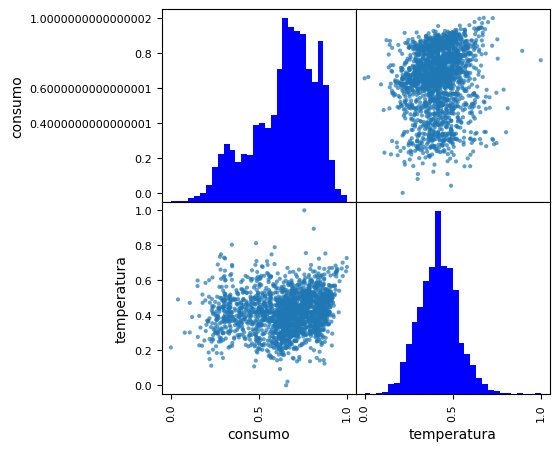

In [7]:
df_consumo_antioquia_normalizada = df_consumo_antioquia[['consumo', 'temperatura']]
df_consumo_antioquia_normalizada = (df_consumo_antioquia_normalizada - df_consumo_antioquia_normalizada.min())/(df_consumo_antioquia_normalizada.max() - df_consumo_antioquia_normalizada.min())

pd.plotting.scatter_matrix(df_consumo_antioquia_normalizada, alpha=0.7, figsize=(5, 5), range_padding = 0.1, diagonal='hist',
                            hist_kwds = {'bins':30, 'color':'blue'})
plt.show()

In [8]:
spearman = []
valor_p = []
data = df_consumo_antioquia_normalizada.values
data = np.asarray(data)

for _,n in enumerate(np.arange(0,data.shape[1])):
  for _,m in enumerate(np.arange(0,data.shape[1])):
      s_valor, p_valor = spearmanr(data[:,n], data[:,m])
      spearman.append(s_valor)
      valor_p.append(p_valor)

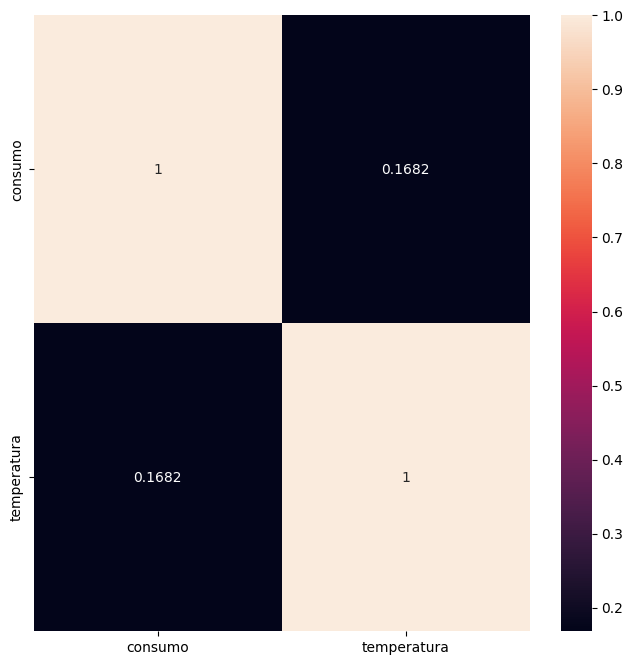

In [9]:
spearman = np.asarray(spearman)
valor_p = np.asarray(valor_p)

spearman_r = spearman.reshape(data.shape[1],data.shape[1])
p_value = valor_p.reshape(data.shape[1],data.shape[1])

plt.figure(figsize=(8,8))
ax = sns.heatmap(np.around(spearman_r,4), annot=True, fmt='g', xticklabels = df_consumo_antioquia_normalizada.columns, yticklabels = df_consumo_antioquia_normalizada.columns)
plt.show()

## Visualización tendencias del consumo

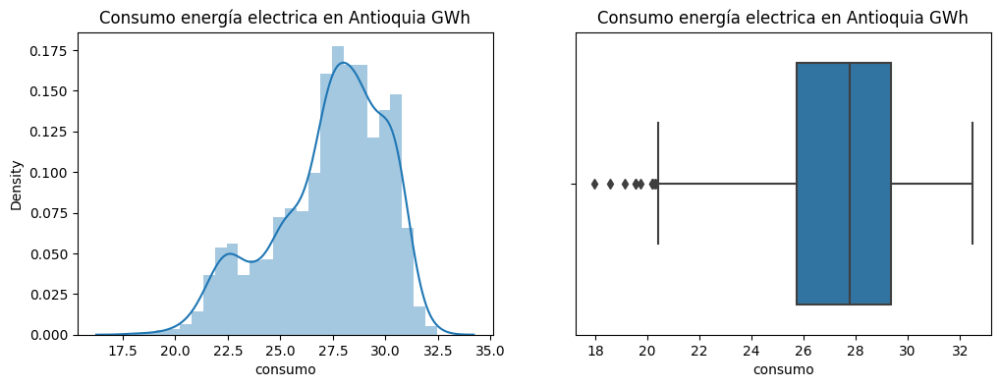

In [10]:
#Histograma y boxplot del consumo de energía en antioquia

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.title('Consumo energía electrica en Antioquia GWh')
sns.distplot(df_consumo_antioquia['consumo'])

plt.subplot(1,2,2)
plt.title('Consumo energía electrica en Antioquia GWh')
sns.boxplot(x=df_consumo_antioquia['consumo'])

plt.show()

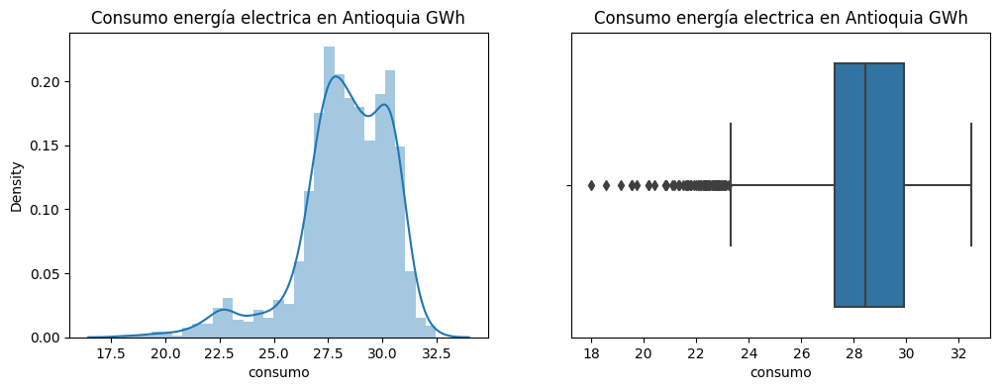

In [11]:
#Histograma y boxplot del consumo de energía en antioquia para los dias de semana

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.title('Consumo energía electrica en Antioquia GWh')
sns.distplot(df_consumo_antioquia[df_consumo_antioquia['fin_de_semana'] == 0]['consumo'])

plt.subplot(1,2,2)
plt.title('Consumo energía electrica en Antioquia GWh')
sns.boxplot(x=df_consumo_antioquia[df_consumo_antioquia['fin_de_semana'] == 0]['consumo'])

plt.show()

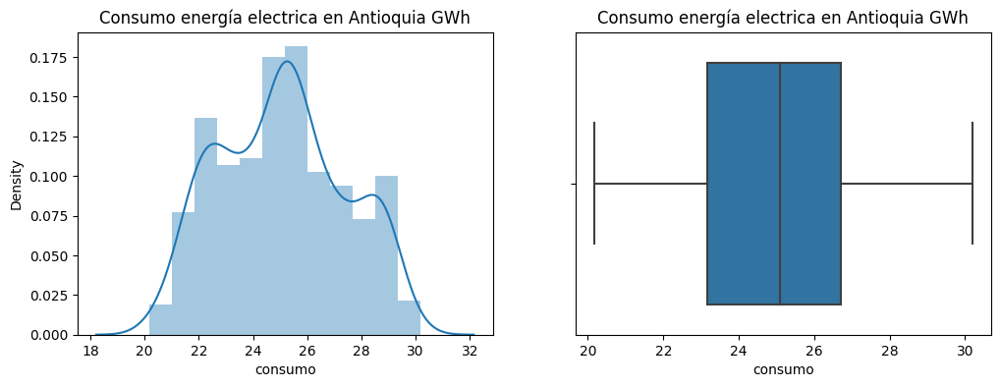

In [12]:
#Histograma y boxplot del consumo de energía en antioquia para los dias de semana

plt.figure(figsize=(12,4))

plt.subplot(1,2,1)
plt.title('Consumo energía electrica en Antioquia GWh')
sns.distplot(df_consumo_antioquia[df_consumo_antioquia['fin_de_semana'] == 1]['consumo'])

plt.subplot(1,2,2)
plt.title('Consumo energía electrica en Antioquia GWh')
sns.boxplot(x=df_consumo_antioquia[df_consumo_antioquia['fin_de_semana'] == 1]['consumo'])

plt.show()

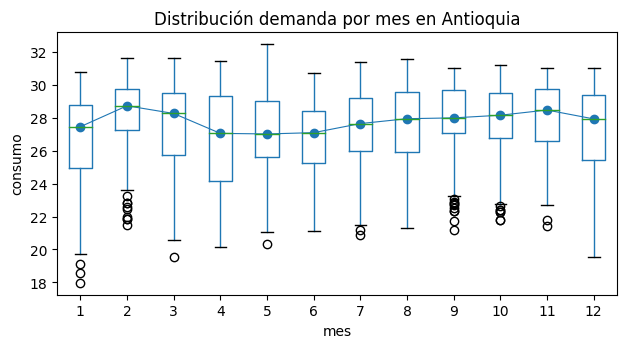

In [13]:
# Boxplot para estacionalidad anual
fig, ax = plt.subplots(figsize=(7, 3.5))
df_consumo_antioquia.boxplot(column='consumo', by='mes', ax=ax)
df_consumo_antioquia.groupby('mes')['consumo'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('consumo')
ax.set_title('Distribución demanda por mes en Antioquia')
fig.suptitle('');

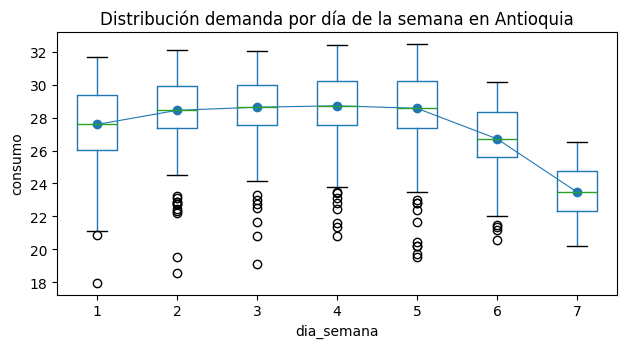

In [14]:
# Boxplot para estacionalidad semanal
fig, ax = plt.subplots(figsize=(7, 3.5))
df_consumo_antioquia.boxplot(column='consumo', by='dia_semana', ax=ax)
df_consumo_antioquia.groupby('dia_semana')['consumo'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('consumo')
ax.set_title('Distribución demanda por día de la semana en Antioquia')
fig.suptitle('');

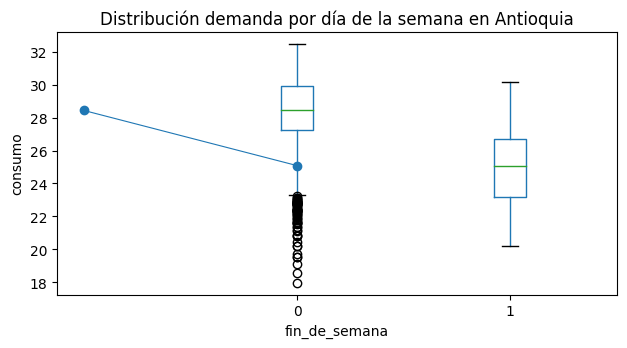

In [15]:
# Gráfico boxplot para estacionalidad según si es fin de semana o no
# ==============================================================================
fig, ax = plt.subplots(figsize=(7, 3.5))
df_consumo_antioquia.boxplot(column='consumo', by='fin_de_semana', ax=ax)
df_consumo_antioquia.groupby('fin_de_semana')['consumo'].median().plot(style='o-', linewidth=0.8, ax=ax)
ax.set_ylabel('consumo')
ax.set_title('Distribución demanda por día de la semana en Antioquia')
fig.suptitle('');

## Autocorrelación

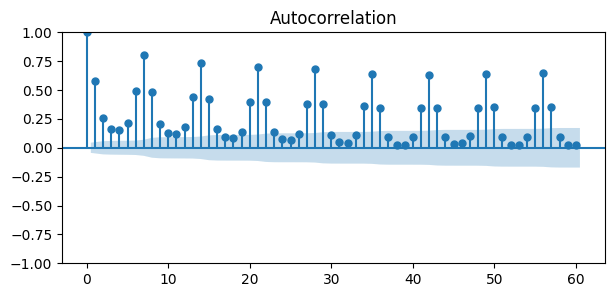

In [16]:
# Gráfico autocorrelación
# ==============================================================================
fig, ax = plt.subplots(figsize=(7, 3))
plot_acf(df_consumo_antioquia['consumo'], ax=ax, lags=60)
plt.show()

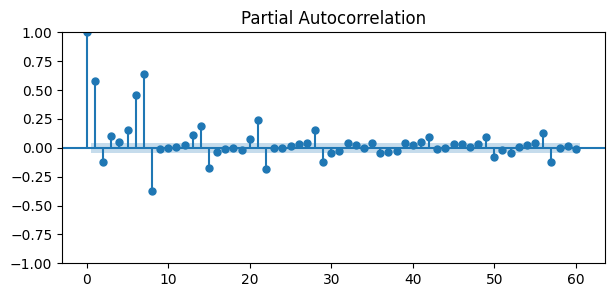

In [17]:
# Gráfico autocorrelación parcial
# ==============================================================================
fig, ax = plt.subplots(figsize=(7, 3))
plot_pacf(df_consumo_antioquia['consumo'], ax=ax, lags=60)
plt.show()

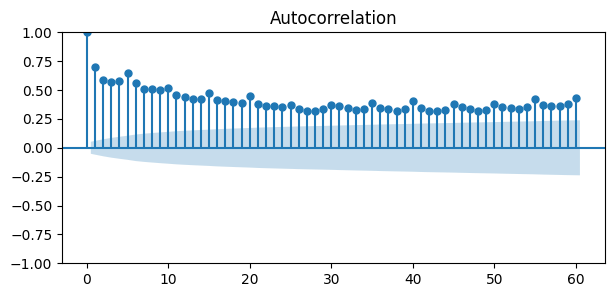

In [18]:
# Gráfico autocorrelación para los dias de semana
# ==============================================================================
fig, ax = plt.subplots(figsize=(7, 3))
plot_acf(df_consumo_antioquia[df_consumo_antioquia['fin_de_semana'] == 0]['consumo'], ax=ax, lags=60)
plt.show()

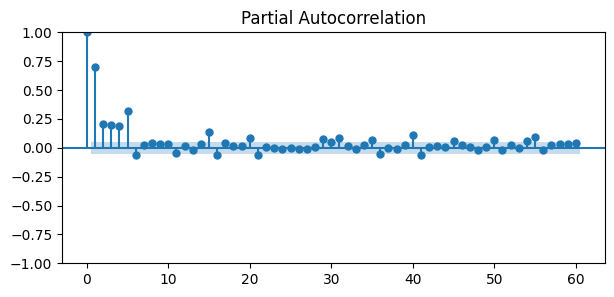

In [19]:
# Gráfico autocorrelación parcial para los dias de semana
# ==============================================================================
fig, ax = plt.subplots(figsize=(7, 3))
plot_pacf(df_consumo_antioquia[df_consumo_antioquia['fin_de_semana'] == 0]['consumo'], ax=ax, lags=60)
plt.show()

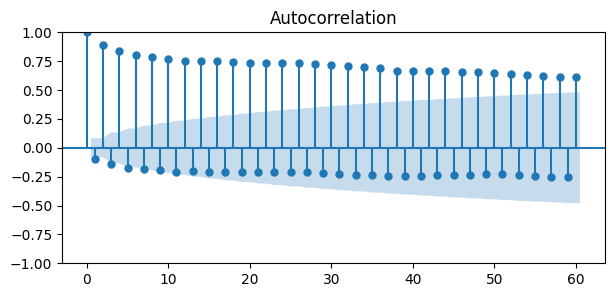

In [20]:
# Gráfico autocorrelación para los fines de semana
# ==============================================================================
fig, ax = plt.subplots(figsize=(7, 3))
plot_acf(df_consumo_antioquia[df_consumo_antioquia['fin_de_semana'] == 1]['consumo'], ax=ax, lags=60)
plt.show()

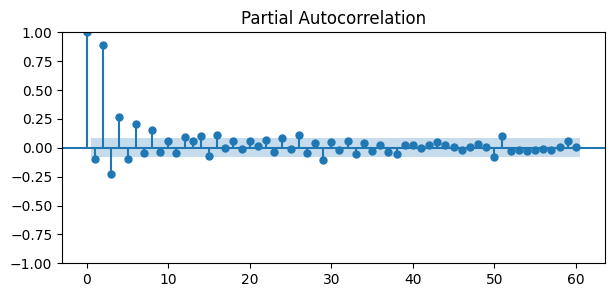

In [21]:
# Gráfico autocorrelación parcial para los dias de semana
# ==============================================================================
fig, ax = plt.subplots(figsize=(7, 3))
plot_pacf(df_consumo_antioquia[df_consumo_antioquia['fin_de_semana'] == 1]['consumo'], ax=ax, lags=60)
plt.show()

## Grafico de series de tiempo del consumo de energía eléctrica en Antioquia

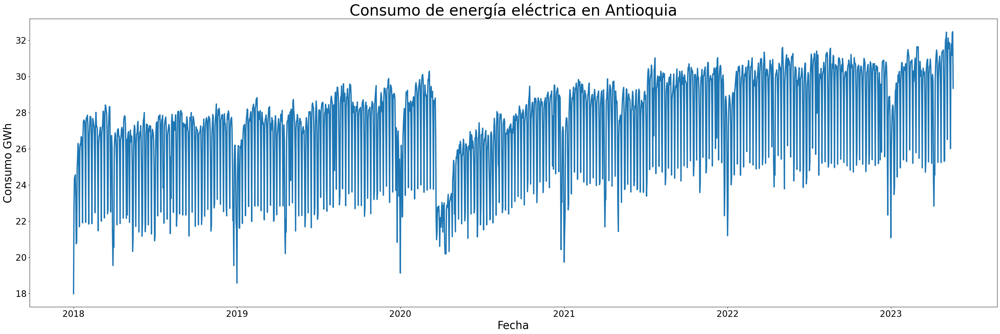

In [22]:
plt.figure(figsize=(40,12))
plt.plot(df_consumo_antioquia['fecha'], df_consumo_antioquia['consumo'], linewidth=3)
plt.title('Consumo de energía eléctrica en Antioquia', fontsize = 35)
plt.xlabel('Fecha', fontsize = 25)
plt.xticks(fontsize = 20)
plt.ylabel('Consumo GWh', fontsize = 25)
plt.yticks(fontsize = 20)
plt.show()

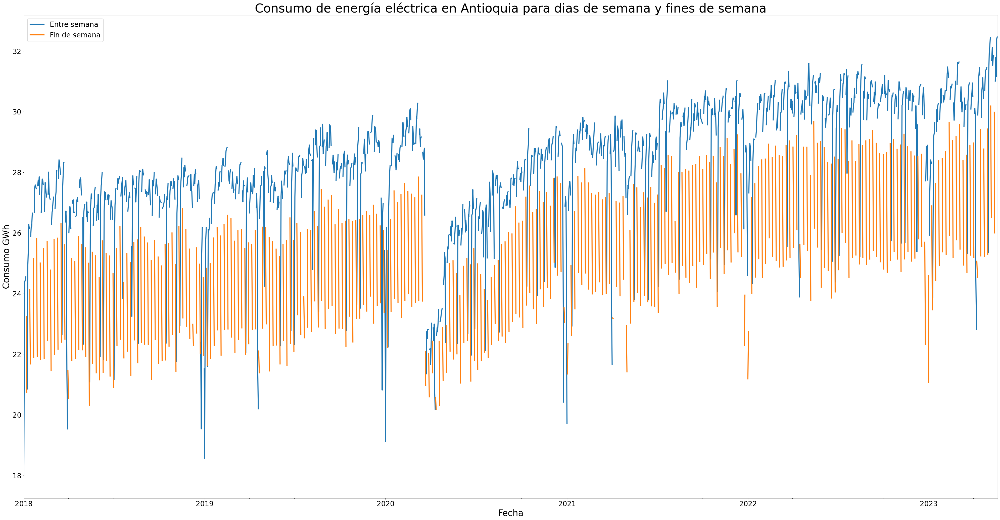

In [23]:
df_consumo_antioquia_ = df_consumo_antioquia.copy(deep=True)

df_consumo_antioquia_['fin_de_semana'] = np.where(df_consumo_antioquia_['fin_de_semana'] == 0, 'Entre semana', 'Fin de semana')
df_consumo_antioquia_ = df_consumo_antioquia_.pivot(index='fecha', columns='fin_de_semana', values='consumo')

df_consumo_antioquia_.plot(figsize = (50, 25), linewidth = 3)
plt.title('Consumo de energía eléctrica en Antioquia para dias de semana y fines de semana', fontsize = 35)
plt.xlabel('Fecha', fontsize = 25)
plt.xticks(fontsize = 20)
plt.ylabel('Consumo GWh', fontsize = 25)
plt.yticks(fontsize = 20)
plt.legend(fontsize = 20)
plt.show()

## Grafico de series de tiempo de la temperatura en Antioquia

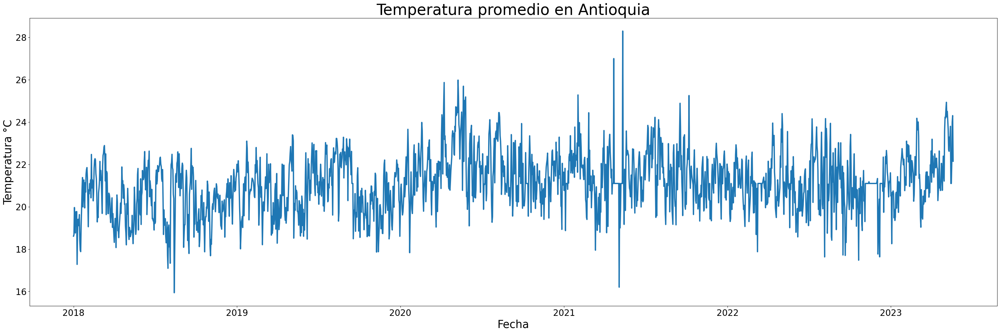

In [24]:
plt.figure(figsize=(40,12))
plt.plot(df_consumo_antioquia['fecha'], df_consumo_antioquia['temperatura'], linewidth=3)
plt.title('Temperatura promedio en Antioquia', fontsize = 35)
plt.xlabel('Fecha', fontsize = 25)
plt.xticks(fontsize = 20)
plt.ylabel('Temperatura °C', fontsize = 25)
plt.yticks(fontsize = 20)
plt.show()

# Predicciones

## Funciones

In [25]:
def train_test_split(dataframe, porcentaje):
  train = int(len(dataframe)*porcentaje)
  test = len(dataframe) - train

  datos_train = dataframe[:-test]
  datos_test  = dataframe[-test:]

  return train, datos_train, test, datos_test

In [26]:
def train_test_split_graph(train, datos_train, test, datos_test):
  print(f'Fechas train : {datos_train.fecha.min()} --- {datos_train.fecha.max()}  (n={train})')
  print(f'Fechas test  : {datos_test.fecha.min()} --- {datos_test.fecha.max()}  (n={test})')

  fig, ax = plt.subplots(figsize=(20, 5))
  datos_train['consumo'].plot(ax=ax, label='train')
  datos_test['consumo'].plot(ax=ax, label='test')
  ax.legend()

In [27]:
def autoregresion(datos_train, test, datos_test=pd.DataFrame(), regressor=LinearRegression(), lags=0, transformer_y=None, exog='No'):
  forecaster = ForecasterAutoreg(
                regressor = regressor,
                lags = lags,
                transformer_y = transformer_y

             )
  forecaster.fit(y=datos_train['consumo'], exog=None if exog == 'No' else datos_train[exog])

  predicciones = forecaster.predict_interval(steps=test, exog=None if exog == 'No' else datos_test[exog], interval = [5, 95], n_boot = 50)

  return predicciones

In [28]:
def regresion_graphs(train, datos_train, datos_test, predicciones):
  fig, ax = plt.subplots(figsize=(20, 5))
  datos_train['consumo'].plot(ax=ax, label='train')
  datos_test['consumo'].plot(ax=ax, label='test')
  predicciones['pred'].plot(ax=ax, label='predicciones')
  ax.legend();

  fig, ax = plt.subplots(figsize=(20, 5))
  datos_test['consumo'].plot(ax=ax, label='test')
  predicciones['pred'].plot(ax=ax, label='predicciones')
  ax.legend();

  fig, ax = plt.subplots(figsize=(20, 5))
  datos_test['consumo'].loc[:(train + 15)].plot(ax=ax, label='test')
  predicciones['pred'][:16].plot(ax=ax, label='predicciones')
  ax.legend();

In [29]:
def regresion_graphs_predict_interval(train, datos_test, predicciones):
  fig, ax = plt.subplots(figsize=(20, 5))
  datos_test['consumo'].loc[:(train + 15)].plot(ax=ax, label='test')
  predicciones['pred'][:16].plot(ax=ax, label='predicciones')
  ax.fill_between(
      predicciones.index[:16],
      predicciones['lower_bound'][:16],
      predicciones['upper_bound'][:16],
      color = 'red',
      alpha = 0.2
  )
  ax.legend()

## 1) Auto regresión con regresión lineal teniendo en cuenta todos los días

In [30]:
# División del dataset en train y test
train_1, datos_train_1, test_1, datos_test_1 = train_test_split(df_consumo_antioquia, 0.80)

Fechas train : 2018-01-01 00:00:00 --- 2022-04-21 00:00:00  (n=1572)
Fechas test  : 2022-04-22 00:00:00 --- 2023-05-20 00:00:00  (n=394)


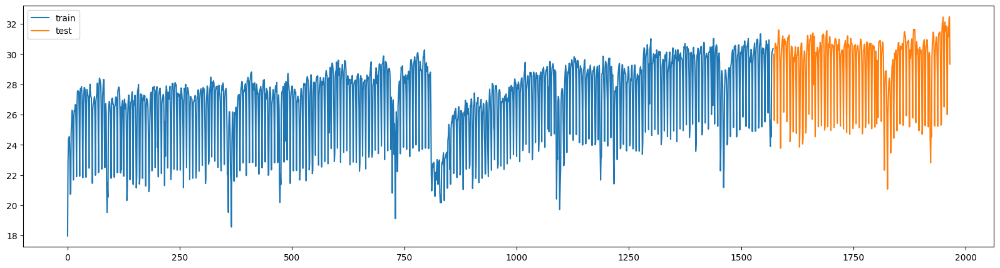

In [31]:
train_test_split_graph(train_1, datos_train_1, test_1, datos_test_1)

In [32]:
# Crear y entrenar forecaster
predicciones_1 = autoregresion(
                              datos_train=datos_train_1,
                               test=test_1,
                               regressor=LinearRegression(),
                               lags=7)
predicciones_1.head()

,pred,lower_bound,upper_bound
1572,25.774303,23.902134,28.922238
1573,25.276583,22.969178,28.481370
1574,25.251337,22.030230,27.218103
1575,28.578103,27.125340,30.848744
1576,29.702894,26.879901,31.375331


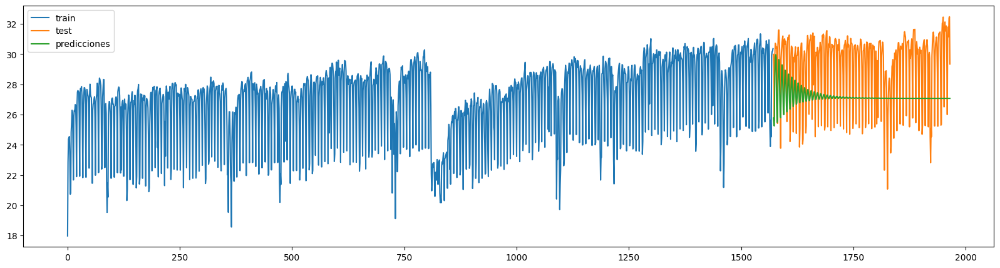

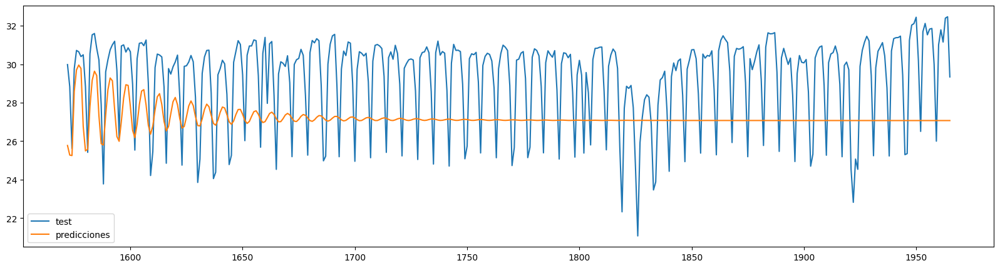

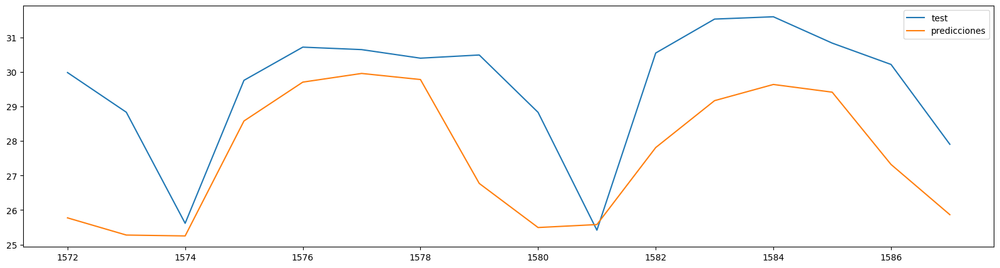

In [33]:
# Gráficos
regresion_graphs(train_1, datos_train_1, datos_test_1, predicciones_1)

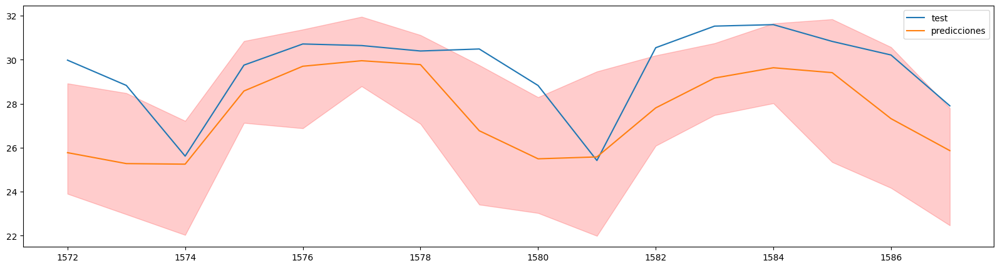

In [34]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_1, datos_test_1, predicciones_1)

### Error

In [35]:
# Cálculo de error para toda la predicción
error_mse_1 = mean_squared_error(y_true=datos_test_1['consumo'], y_pred=predicciones_1['pred'], squared=False)
error_rmse_1 = mean_squared_error(y_true=datos_test_1['consumo'], y_pred=predicciones_1['pred'], squared=True)
error_mae_1 = mean_absolute_error(y_true=datos_test_1['consumo'], y_pred=predicciones_1['pred'])
error_medae_1 = median_absolute_error(y_true=datos_test_1['consumo'], y_pred=predicciones_1['pred'])
error_mape_1 = mean_absolute_percentage_error(y_true=datos_test_1['consumo'], y_pred  = predicciones_1['pred'])

print(f"El error MSE   de test es: {error_mse_1}")
print(f"El error RMSE  de test es: {error_rmse_1}")
print(f"El error MAE   de test es: {error_mae_1}")
print(f"El error MedAE de test es: {error_medae_1}")
print(f"El error MAPE    de test es: {error_mape_1}")

El error MSE   de test es: 2.9858014694356134
El error RMSE  de test es: 8.915010414883868
El error MAE   de test es: 2.7934503315070196
El error MedAE de test es: 2.9479193636678342
El error MAPE    de test es: 0.09457549322746689


In [36]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_1 = mean_squared_error(y_true=datos_test_1['consumo'].loc[:(train_1 + 15)], y_pred=predicciones_1['pred'].loc[:(train_1 + 15)], squared=False)
error_rmse_1 = mean_squared_error(y_true=datos_test_1['consumo'].loc[:(train_1 + 15)], y_pred=predicciones_1['pred'].loc[:(train_1 + 15)], squared=True)
error_mae_1 = mean_absolute_error(y_true=datos_test_1['consumo'].loc[:(train_1 + 15)], y_pred=predicciones_1['pred'].loc[:(train_1 + 15)])
error_medae_1 = median_absolute_error(y_true=datos_test_1['consumo'].loc[:(train_1 + 15)], y_pred=predicciones_1['pred'].loc[:(train_1 + 15)])
error_mape_1 = mean_absolute_percentage_error(y_true=datos_test_1['consumo'].loc[:(train_1 + 15)], y_pred=predicciones_1['pred'].loc[:(train_1 + 15)])

print(f"El error MSE   de test es: {error_mse_1}")
print(f"El error RMSE  de test es: {error_rmse_1}")
print(f"El error MAE   de test es: {error_mae_1}")
print(f"El error MedAE de test es: {error_medae_1}")
print(f"El error R2    de test es: {error_mape_1}")

El error MSE   de test es: 2.3733040783429113
El error RMSE  de test es: 5.6325722482790965
El error MAE   de test es: 2.0152055777980813
El error MedAE de test es: 1.9980484963775904
El error R2    de test es: 0.0674032431701205


## 2) Auto regresión con regresión lineal teniendo en cuenta todos los días con datos normalizados

In [37]:
# División del dataset en train y test
train_2, datos_train_2, test_2, datos_test_2 = train_test_split(df_consumo_antioquia, 0.80)

Fechas train : 2018-01-01 00:00:00 --- 2022-04-21 00:00:00  (n=1572)
Fechas test  : 2022-04-22 00:00:00 --- 2023-05-20 00:00:00  (n=394)


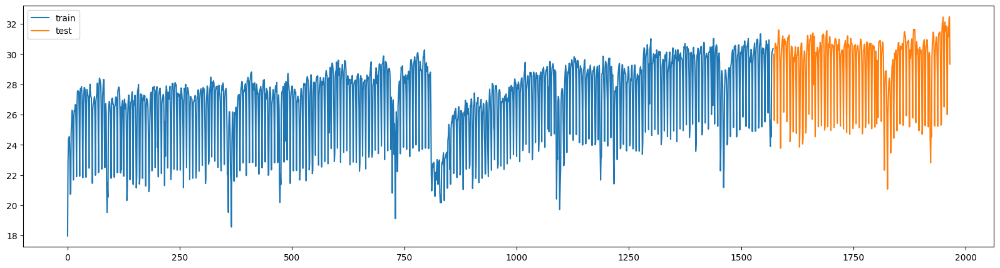

In [38]:
train_test_split_graph(train_2, datos_train_2, test_2, datos_test_2)

In [39]:
# Crear y entrenar forecaster
predicciones_2 = autoregresion(
                              datos_train=datos_train_2,
                               test=test_2,
                               regressor=LinearRegression(),
                               lags=7,
                               transformer_y=MinMaxScaler())

predicciones_2.head()

,pred,lower_bound,upper_bound
1572,25.774303,23.902134,28.922238
1573,25.276583,22.969178,28.481370
1574,25.251337,22.030230,27.218103
1575,28.578103,27.125340,30.848744
1576,29.702894,26.879901,31.375331


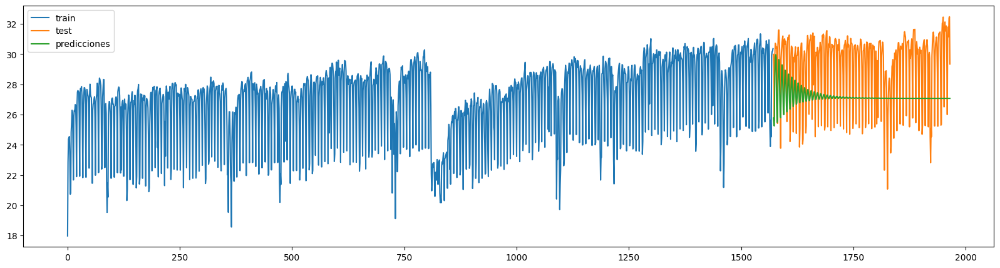

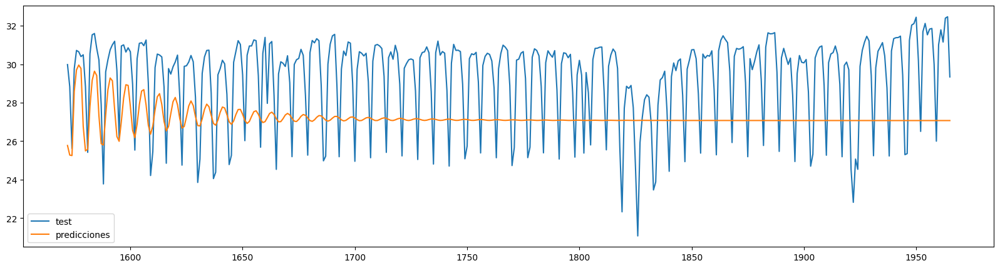

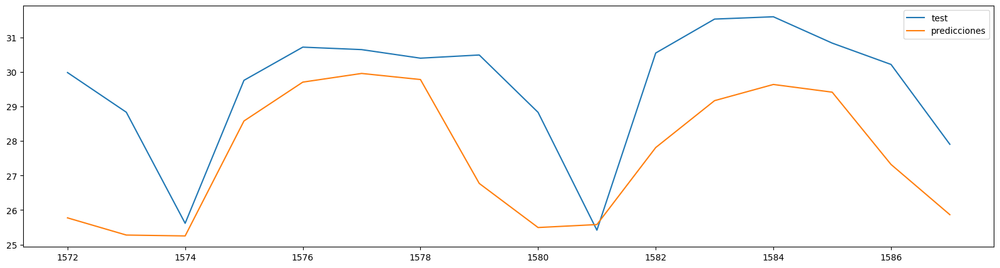

In [40]:
# Gráficos
regresion_graphs(train_2, datos_train_2, datos_test_2, predicciones_2)

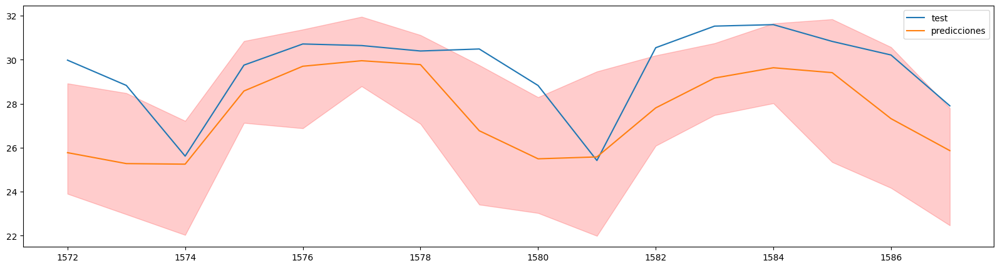

In [41]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_2, datos_test_2, predicciones_2)

### Error

In [42]:
# Cálculo de error para toda la predicción
error_mse_2 = mean_squared_error(y_true=datos_test_2['consumo'], y_pred=predicciones_2['pred'], squared=False)
error_rmse_2 = mean_squared_error(y_true=datos_test_2['consumo'], y_pred=predicciones_2['pred'], squared=True)
error_mae_2 = mean_absolute_error(y_true=datos_test_2['consumo'], y_pred=predicciones_2['pred'])
error_medae_2 = median_absolute_error(y_true=datos_test_2['consumo'], y_pred=predicciones_2['pred'])
error_mape_2 = mean_absolute_percentage_error(y_true=datos_test_2['consumo'], y_pred  = predicciones_2['pred'])

print(f"El error MSE   de test es: {error_mse_2}")
print(f"El error RMSE  de test es: {error_rmse_2}")
print(f"El error MAE   de test es: {error_mae_2}")
print(f"El error MedAE de test es: {error_medae_2}")
print(f"El error MAPE    de test es: {error_mape_2}")

El error MSE   de test es: 2.9858014694358417
El error RMSE  de test es: 8.91501041488523
El error MAE   de test es: 2.793450331507221
El error MedAE de test es: 2.947919363668168
El error MAPE    de test es: 0.09457549322747315


In [43]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_2 = mean_squared_error(y_true=datos_test_2['consumo'].loc[:(train_2 + 15)], y_pred=predicciones_2['pred'].loc[:(train_2 + 15)], squared=False)
error_rmse_2 = mean_squared_error(y_true=datos_test_2['consumo'].loc[:(train_2 + 15)], y_pred=predicciones_2['pred'].loc[:(train_2 + 15)], squared=True)
error_mae_2 = mean_absolute_error(y_true=datos_test_2['consumo'].loc[:(train_2 + 15)], y_pred=predicciones_2['pred'].loc[:(train_2 + 15)])
error_medae_2 = median_absolute_error(y_true=datos_test_2['consumo'].loc[:(train_2 + 15)], y_pred=predicciones_2['pred'].loc[:(train_2 + 15)])
error_mape_2 = mean_absolute_percentage_error(y_true=datos_test_2['consumo'].loc[:(train_2 + 15)], y_pred=predicciones_2['pred'].loc[:(train_2 + 15)])

print(f"El error MSE   de test es: {error_mse_2}")
print(f"El error RMSE  de test es: {error_rmse_2}")
print(f"El error MAE   de test es: {error_mae_2}")
print(f"El error MedAE de test es: {error_medae_2}")
print(f"El error R2    de test es: {error_mape_2}")

El error MSE   de test es: 2.3733040783429704
El error RMSE  de test es: 5.632572248279377
El error MAE   de test es: 2.01520557779814
El error MedAE de test es: 1.9980484963776917
El error R2    de test es: 0.06740324317012243


## 3) Auto regresión con random forest teniendo en cuenta todos los días

In [44]:
# Divión del dataset en train y test
train_3, datos_train_3, test_3, datos_test_3 = train_test_split(df_consumo_antioquia, 0.80)

Fechas train : 2018-01-01 00:00:00 --- 2022-04-21 00:00:00  (n=1572)
Fechas test  : 2022-04-22 00:00:00 --- 2023-05-20 00:00:00  (n=394)


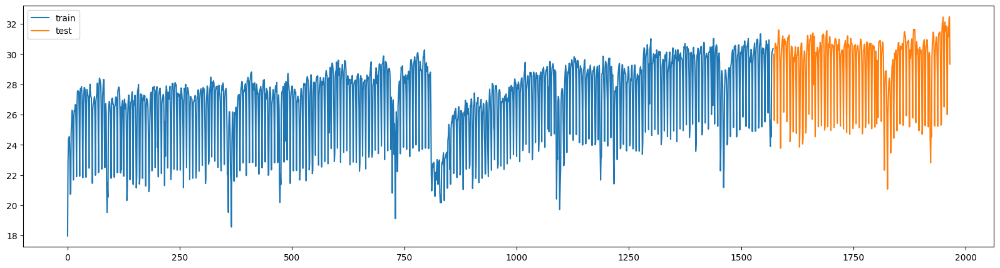

In [45]:
train_test_split_graph(train_3, datos_train_3, test_3, datos_test_3)

In [46]:
# Crear y entrenar forecaster
predicciones_3 = autoregresion(
                              datos_train=datos_train_3,
                               test=test_3,
                               regressor=RandomForestRegressor(random_state=123),
                               lags=7)

predicciones_3.head()

,pred,lower_bound,upper_bound
1572,28.321146,28.008386,28.617787
1573,25.069143,24.355219,25.793689
1574,29.355552,27.397246,29.853628
1575,29.750994,29.018767,30.398604
1576,29.909243,28.629730,30.428898


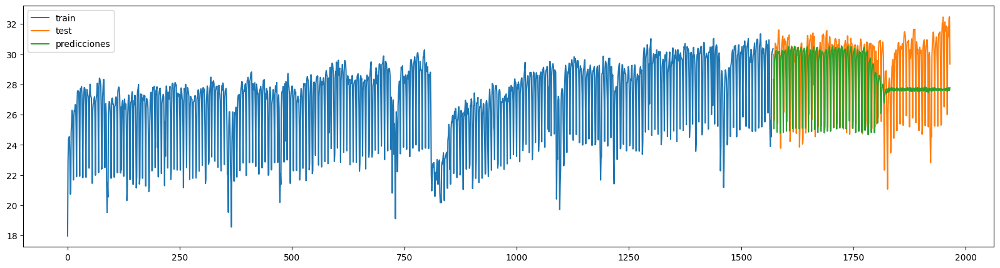

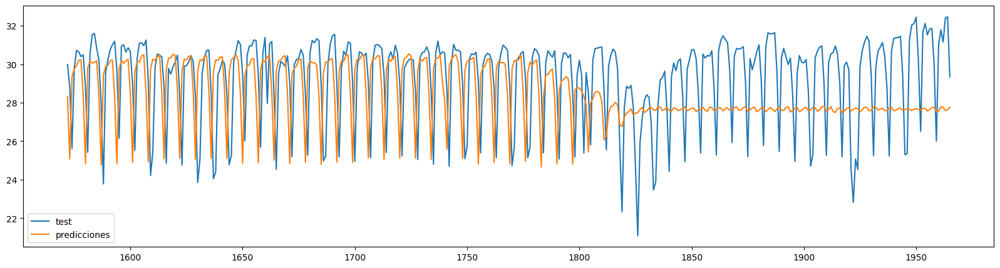

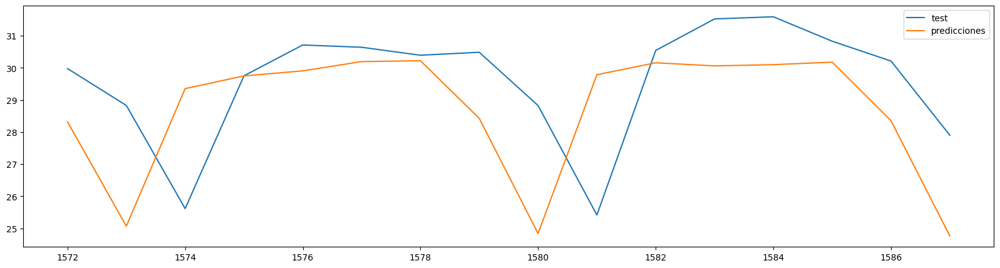

In [47]:
# Gáficos
regresion_graphs(train_3, datos_train_3, datos_test_3, predicciones_3)

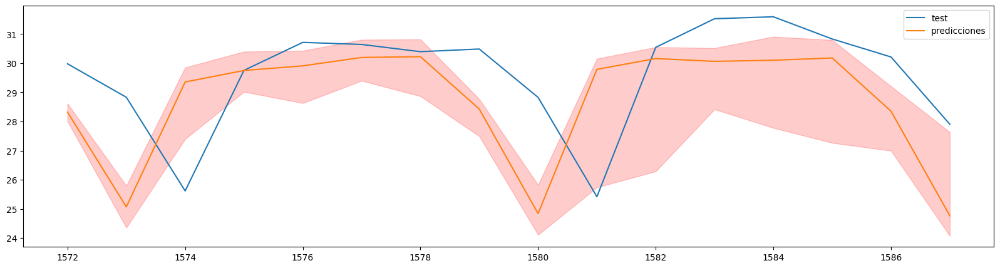

In [48]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_3, datos_test_3, predicciones_3)

### Error

In [49]:
# Cálculo de error para toda la predicción
error_mse_3 = mean_squared_error(y_true=datos_test_3['consumo'], y_pred=predicciones_3['pred'], squared=False)
error_rmse_3 = mean_squared_error(y_true=datos_test_3['consumo'], y_pred=predicciones_3['pred'], squared=True)
error_mae_3 = mean_absolute_error(y_true=datos_test_3['consumo'], y_pred=predicciones_3['pred'])
error_medae_3 = median_absolute_error(y_true=datos_test_3['consumo'], y_pred=predicciones_3['pred'])
error_mape_3 = mean_absolute_percentage_error(y_true=datos_test_3['consumo'], y_pred  = predicciones_3['pred'])

print(f"El error MSE   de test es: {error_mse_3}")
print(f"El error RMSE  de test es: {error_rmse_3}")
print(f"El error MAE   de test es: {error_mae_3}")
print(f"El error MedAE de test es: {error_medae_3}")
print(f"El error MAPE    de test es: {error_mape_3}")

El error MSE   de test es: 2.716575970512649
El error RMSE  de test es: 7.379785003566742
El error MAE   de test es: 2.2433144689418816
El error MedAE de test es: 2.286341053950048
El error MAPE    de test es: 0.07923044606157945


In [50]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_3 = mean_squared_error(y_true=datos_test_3['consumo'].loc[:(train_3 + 15)], y_pred=predicciones_3['pred'].loc[:(train_3 + 15)], squared=False)
error_rmse_3 = mean_squared_error(y_true=datos_test_3['consumo'].loc[:(train_3 + 15)], y_pred=predicciones_3['pred'].loc[:(train_3 + 15)], squared=True)
error_mae_3 = mean_absolute_error(y_true=datos_test_3['consumo'].loc[:(train_3 + 15)], y_pred=predicciones_3['pred'].loc[:(train_3 + 15)])
error_medae_3 = median_absolute_error(y_true=datos_test_3['consumo'].loc[:(train_3 + 15)], y_pred=predicciones_3['pred'].loc[:(train_3 + 15)])
error_mape_3 = mean_absolute_percentage_error(y_true=datos_test_3['consumo'].loc[:(train_3 + 15)], y_pred=predicciones_3['pred'].loc[:(train_3 + 15)])

print(f"El error MSE   de test es: {error_mse_3}")
print(f"El error RMSE  de test es: {error_rmse_3}")
print(f"El error MAE   de test es: {error_mae_3}")
print(f"El error MedAE de test es: {error_medae_3}")
print(f"El error MAPE    de test es: {error_mape_3}")

El error MSE   de test es: 2.362256246944311
El error RMSE  de test es: 5.580254576227421
El error MAE   de test es: 1.8750587663625002
El error MedAE de test es: 1.575588440450007
El error MAPE    de test es: 0.06611091520769405


## 4) Auto regresión con random forest teniendo en cuenta todos los días con datos normalizados

In [51]:
# División del dataset en train y test
train_4, datos_train_4, test_4, datos_test_4 = train_test_split(df_consumo_antioquia, 0.80)

Fechas train : 2018-01-01 00:00:00 --- 2022-04-21 00:00:00  (n=1572)
Fechas test  : 2022-04-22 00:00:00 --- 2023-05-20 00:00:00  (n=394)


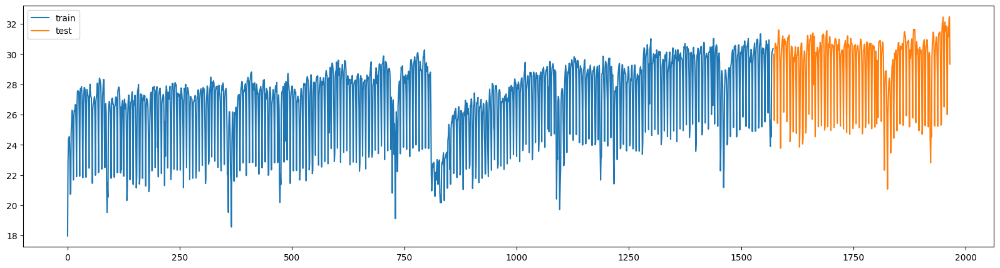

In [52]:
train_test_split_graph(train_4, datos_train_4, test_4, datos_test_4)

In [53]:
# Crear y entrenar forecaster
predicciones_4 = autoregresion(
                              datos_train=datos_train_4,
                               test=test_4,
                               regressor=RandomForestRegressor(random_state=123),
                               lags=7,
                               transformer_y=MinMaxScaler())

predicciones_4.head()

,pred,lower_bound,upper_bound
1572,28.189122,27.887973,28.489744
1573,25.124861,24.395149,25.764112
1574,29.250057,27.972364,29.793647
1575,29.287679,28.917452,30.403357
1576,29.327755,27.948042,30.376805


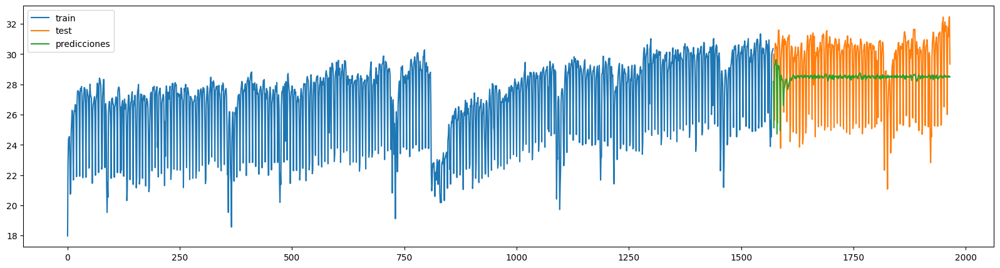

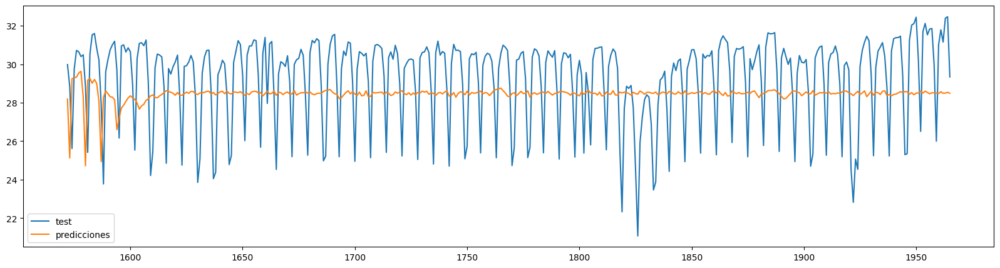

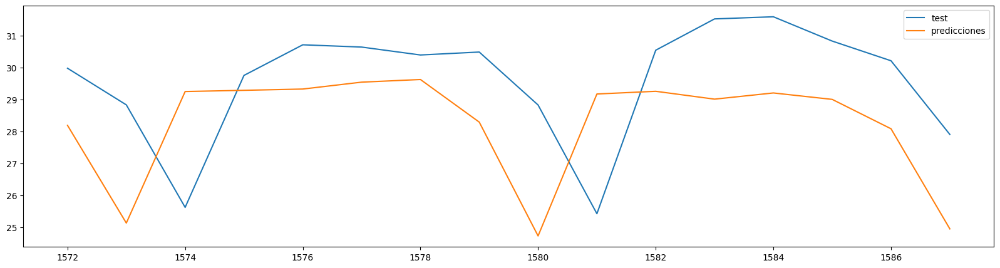

In [54]:
# Gráficos
regresion_graphs(train_4, datos_train_4, datos_test_4, predicciones_4)

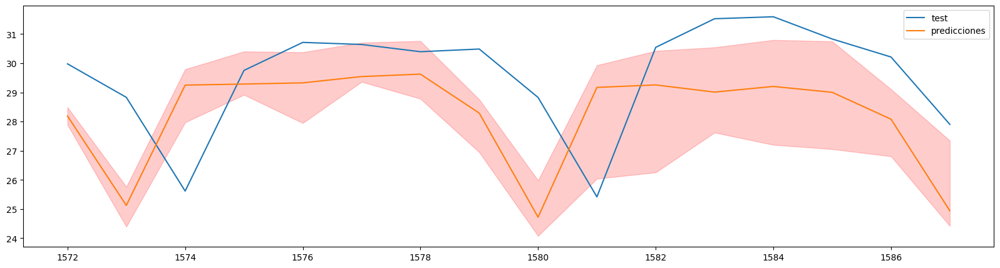

In [55]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_4, datos_test_4, predicciones_4)

### Error

In [56]:
# Cálculo de error para toda la predicción
error_mse_4 = mean_squared_error(y_true=datos_test_4['consumo'], y_pred=predicciones_4['pred'], squared=False)
error_rmse_4 = mean_squared_error(y_true=datos_test_4['consumo'], y_pred=predicciones_4['pred'], squared=True)
error_mae_4 = mean_absolute_error(y_true=datos_test_4['consumo'], y_pred=predicciones_4['pred'])
error_medae_4 = median_absolute_error(y_true=datos_test_4['consumo'], y_pred=predicciones_4['pred'])
error_mape_4 = mean_absolute_percentage_error(y_true=datos_test_4['consumo'], y_pred  = predicciones_4['pred'])

print(f"El error MSE   de test es: {error_mse_4}")
print(f"El error RMSE  de test es: {error_rmse_4}")
print(f"El error MAE   de test es: {error_mae_4}")
print(f"El error MedAE de test es: {error_medae_4}")
print(f"El error MAPE    de test es: {error_mape_4}")

El error MSE   de test es: 2.393748267457076
El error RMSE  de test es: 5.730030767953752
El error MAE   de test es: 2.1318761843154848
El error MedAE de test es: 2.1246414768499964
El error MAPE    de test es: 0.07471533671452031


In [57]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_4 = mean_squared_error(y_true=datos_test_4['consumo'].loc[:(train_4 + 15)], y_pred=predicciones_4['pred'].loc[:(train_4 + 15)], squared=False)
error_rmse_4 = mean_squared_error(y_true=datos_test_4['consumo'].loc[:(train_4 + 15)], y_pred=predicciones_4['pred'].loc[:(train_4 + 15)], squared=True)
error_mae_4 = mean_absolute_error(y_true=datos_test_4['consumo'].loc[:(train_4 + 15)], y_pred=predicciones_4['pred'].loc[:(train_4 + 15)])
error_medae_4 = median_absolute_error(y_true=datos_test_4['consumo'].loc[:(train_4 + 15)], y_pred=predicciones_4['pred'].loc[:(train_4 + 15)])
error_mape_4 = mean_absolute_percentage_error(y_true=datos_test_4['consumo'].loc[:(train_4 + 15)], y_pred=predicciones_4['pred'].loc[:(train_4 + 15)])

print(f"El error MSE   de test es: {error_mse_4}")
print(f"El error RMSE  de test es: {error_rmse_4}")
print(f"El error MAE   de test es: {error_mae_4}")
print(f"El error MedAE de test es: {error_medae_4}")
print(f"El error MAPE    de test es: {error_mape_4}")

El error MSE   de test es: 2.503132860589039
El error RMSE  de test es: 6.265674117760666
El error MAE   de test es: 2.2519822174187456
El error MedAE de test es: 2.165227596599996
El error MAPE    de test es: 0.07800921896559136


## 5) Auto regresión con random forest teniendo en cuenta todos los días ajustando de hiperparámetros

In [58]:
# División del dataset en train y test
train_5, datos_train_5, test_5, datos_test_5 = train_test_split(df_consumo_antioquia, 0.80)

Fechas train : 2018-01-01 00:00:00 --- 2022-04-21 00:00:00  (n=1572)
Fechas test  : 2022-04-22 00:00:00 --- 2023-05-20 00:00:00  (n=394)


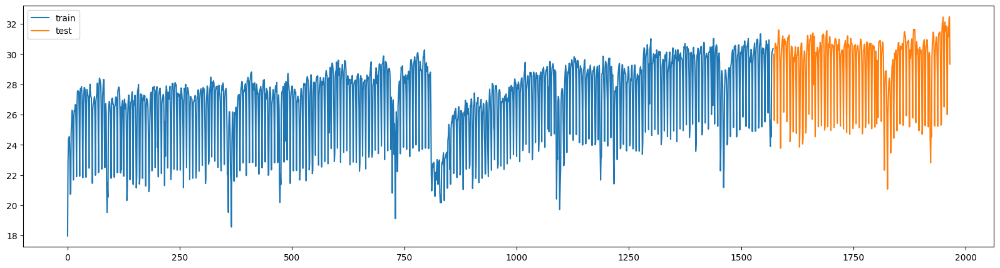

In [59]:
train_test_split_graph(train_5, datos_train_5, test_5, datos_test_5)

In [60]:
forecaster_5 = ForecasterAutoreg(
                regressor = RandomForestRegressor(random_state=123),
                lags      = 7 # Este valor será remplazado en el grid search
             )

# Lags utilizados como predictores
lags_grid_5 = [3, 5, 7, 10, 15, 20, 25, 30]

# Hiperparámetros del regresor
param_grid_5 = {'n_estimators': [10, 20, 30, 40, 50, 100, 150, 200],
              'max_depth'   : [2, 4, 6, 8, 10, 50, 100]}

resultados_grid_5 = grid_search_forecaster(
                        forecaster         = forecaster_5,
                        y                  = datos_train_5['consumo'],
                        param_grid         = param_grid_5,
                        lags_grid          = lags_grid_5,
                        steps              = test_5,
                        refit              = True,
                        metric             = 'mean_squared_error',
                        initial_train_size = int(len(datos_train_5)*0.5),
                        fixed_train_size   = False,
                        return_best        = True,
                        verbose            = False
                  )

Number of models compared: 448.


lags grid:   0%|          | 0/8 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

`Forecaster` refitted using the best-found lags and parameters, and the whole data set: 
  Lags: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20] 
  Parameters: {'max_depth': 100, 'n_estimators': 10}
  Backtesting metric: 4.5426386032218256



In [61]:
# Resultados Grid Search
resultados_grid_5

,lags,params,mean_squared_error,max_depth,n_estimators
328,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 100, 'n_estimators': 10}",4.542639,100,10
320,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 50, 'n_estimators': 10}",4.542639,50,10
322,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 50, 'n_estimators': 30}",4.608088,50,30
330,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 100, 'n_estimators': 30}",4.608088,100,30
446,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 100, 'n_estimators': 150}",4.610314,100,150
...,...,...,...,...,...
102,"[1, 2, 3, 4, 5]","{'max_depth': 50, 'n_estimators': 150}",22.793373,50,150
44,"[1, 2, 3]","{'max_depth': 50, 'n_estimators': 50}",25.311203,50,50
52,"[1, 2, 3]","{'max_depth': 100, 'n_estimators': 50}",25.311203,100,50
48,"[1, 2, 3]","{'max_depth': 100, 'n_estimators': 10}",25.701304,100,10


In [62]:
# Crear y entrenar forecaster con mejores hiperparámetros
predicciones_5 = autoregresion(
                              datos_train=datos_train_5,
                               test=test_5,
                               regressor=RandomForestRegressor(max_depth=100, n_estimators=10, random_state=123),
                              lags=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])

predicciones_5.head()

,pred,lower_bound,upper_bound
1572,29.290670,28.540857,30.105900
1573,27.001482,25.911363,27.296437
1574,25.091956,24.811691,25.591408
1575,28.605509,28.300804,29.237023
1576,29.588245,26.886626,30.296480


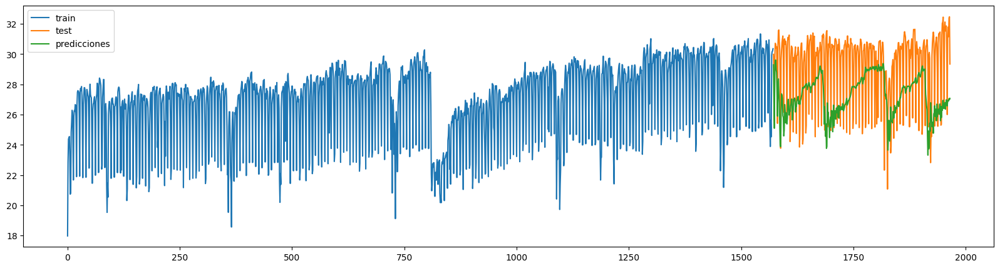

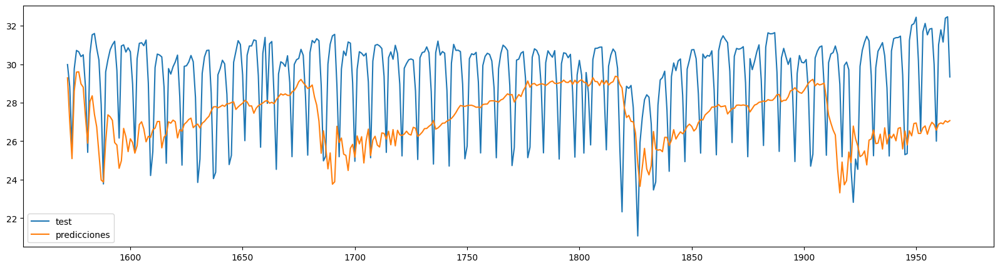

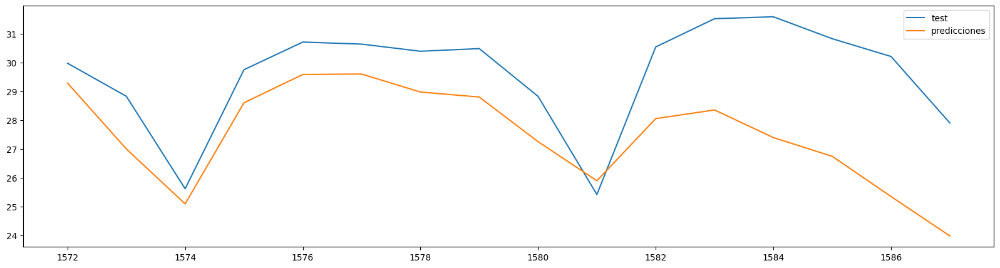

In [63]:
# Gráficos
regresion_graphs(train_5, datos_train_5, datos_test_5, predicciones_5)

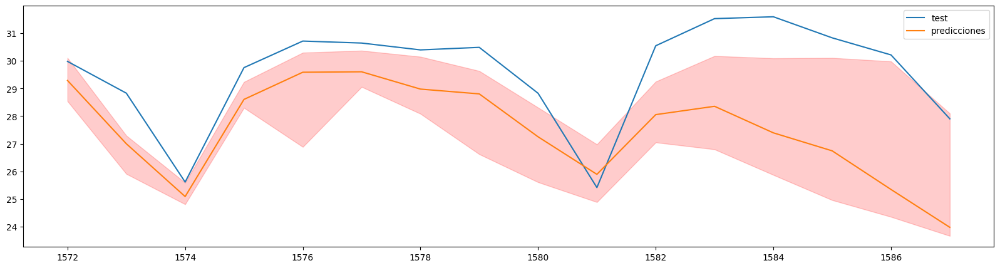

In [64]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_5, datos_test_5, predicciones_5)

### Error

In [65]:
# Cálculo de error para toda la predicción
error_mse_5 = mean_squared_error(y_true=datos_test_5['consumo'], y_pred=predicciones_5['pred'], squared=False)
error_rmse_5 = mean_squared_error(y_true=datos_test_5['consumo'], y_pred=predicciones_5['pred'], squared=True)
error_mae_5 = mean_absolute_error(y_true=datos_test_5['consumo'], y_pred=predicciones_5['pred'])
error_medae_5 = median_absolute_error(y_true=datos_test_5['consumo'], y_pred=predicciones_5['pred'])
error_mape_5 = mean_absolute_percentage_error(y_true=datos_test_5['consumo'], y_pred  = predicciones_5['pred'])

print(f"El error MSE   de test es: {error_mse_5}")
print(f"El error RMSE  de test es: {error_rmse_5}")
print(f"El error MAE   de test es: {error_mae_5}")
print(f"El error MedAE de test es: {error_medae_5}")
print(f"El error MAPE    de test es: {error_mape_5}")

El error MSE   de test es: 3.2007555965917507
El error RMSE  de test es: 10.244836389113415
El error MAE   de test es: 2.8248402952131983
El error MedAE de test es: 2.8331657584999945
El error MAPE    de test es: 0.09584786620206419


In [66]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_5 = mean_squared_error(y_true=datos_test_5['consumo'].loc[:(train_5 + 15)], y_pred=predicciones_5['pred'].loc[:(train_5 + 15)], squared=False)
error_rmse_5 = mean_squared_error(y_true=datos_test_5['consumo'].loc[:(train_5 + 15)], y_pred=predicciones_5['pred'].loc[:(train_5 + 15)], squared=True)
error_mae_5 = mean_absolute_error(y_true=datos_test_5['consumo'].loc[:(train_5 + 15)], y_pred=predicciones_5['pred'].loc[:(train_5 + 15)])
error_medae_5 = median_absolute_error(y_true=datos_test_5['consumo'].loc[:(train_5 + 15)], y_pred=predicciones_5['pred'].loc[:(train_5 + 15)])
error_mape_5 = mean_absolute_percentage_error(y_true=datos_test_5['consumo'].loc[:(train_5 + 15)], y_pred=predicciones_5['pred'].loc[:(train_5 + 15)])

print(f"El error MSE   de test es: {error_mse_5}")
print(f"El error RMSE  de test es: {error_rmse_5}")
print(f"El error MAE   de test es: {error_mae_5}")
print(f"El error MedAE de test es: {error_medae_5}")
print(f"El error MAPE    de test es: {error_mape_5}")

El error MSE   de test es: 2.561809795362594
El error RMSE  de test es: 6.562869427615734
El error MAE   de test es: 2.140789660312497
El error MedAE de test es: 1.6289267629999955
El error MAPE    de test es: 0.07129830295149357


## 6) Auto regresión con random forest teniendo en cuenta todos los días con datos normalizados ajustando de hiperparámetros

In [67]:
# División del dataset en train y test
train_6, datos_train_6, test_6, datos_test_6 = train_test_split(df_consumo_antioquia, 0.80)

Fechas train : 2018-01-01 00:00:00 --- 2022-04-21 00:00:00  (n=1572)
Fechas test  : 2022-04-22 00:00:00 --- 2023-05-20 00:00:00  (n=394)


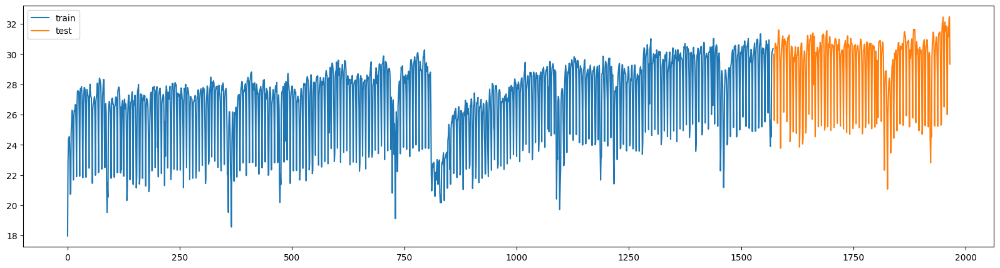

In [68]:
train_test_split_graph(train_6, datos_train_6, test_6, datos_test_6)

In [ ]:
forecaster_6 = ForecasterAutoreg(
                regressor = RandomForestRegressor(random_state=123),
                lags      = 7 # Este valor será remplazado en el grid search
             )

# Lags utilizados como predictores
lags_grid_6 = [3, 5, 7, 10, 15, 20, 25, 30]

# Hiperparámetros del regresor
param_grid_6 = {'n_estimators': [10, 20, 30, 40, 50, 100, 150, 200],
              'max_depth'   : [2, 4, 6, 8, 10, 50, 100]}

resultados_grid_6 = grid_search_forecaster(
                        forecaster         = forecaster_6,
                        y                  = datos_train_6['consumo'],
                        param_grid         = param_grid_6,
                        lags_grid          = lags_grid_6,
                        steps              = test_6,
                        refit              = True,
                        metric             = 'mean_squared_error',
                        initial_train_size = int(len(datos_train_6)*0.5),
                        fixed_train_size   = False,
                        return_best        = True,
                        verbose            = False
                  )

Number of models compared: 448.


lags grid:   0%|          | 0/8 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

params grid:   0%|          | 0/56 [00:00<?, ?it/s]

In [ ]:
# Resultados Grid Search
resultados_grid_6

,lags,params,mean_squared_error,max_depth,n_estimators
328,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 100, 'n_estimators': 10}",4.542639,100,10
320,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 50, 'n_estimators': 10}",4.542639,50,10
322,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 50, 'n_estimators': 30}",4.608088,50,30
330,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 100, 'n_estimators': 30}",4.608088,100,30
446,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...","{'max_depth': 100, 'n_estimators': 150}",4.610314,100,150
...,...,...,...,...,...
102,"[1, 2, 3, 4, 5]","{'max_depth': 50, 'n_estimators': 150}",22.793373,50,150
44,"[1, 2, 3]","{'max_depth': 50, 'n_estimators': 50}",25.311203,50,50
52,"[1, 2, 3]","{'max_depth': 100, 'n_estimators': 50}",25.311203,100,50
48,"[1, 2, 3]","{'max_depth': 100, 'n_estimators': 10}",25.701304,100,10


In [70]:
# Crear y entrenar forecaster con mejores hiperparámetros
predicciones_6 = autoregresion(
                              datos_train=datos_train_5,
                               test=test_5,
                               regressor=RandomForestRegressor(max_depth=100, n_estimators=10, random_state=123),
                              lags=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
                              transformer_y=MinMaxScaler())

predicciones_6.head()

,pred,lower_bound,upper_bound
1572,28.849070,28.102366,29.751486
1573,26.489437,25.556678,26.917717
1574,24.588648,24.083023,24.928236
1575,28.780912,27.514789,29.240892
1576,29.760945,27.461556,30.261866


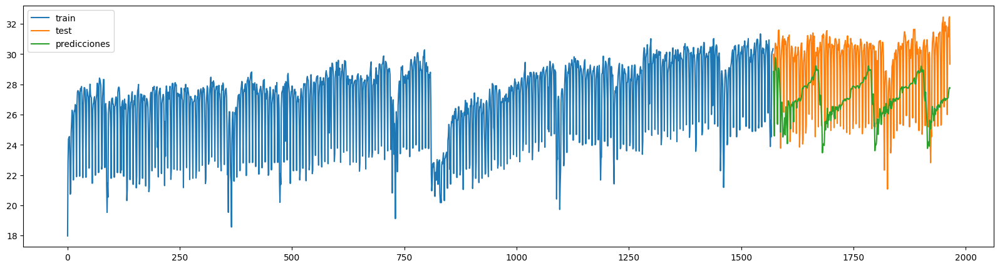

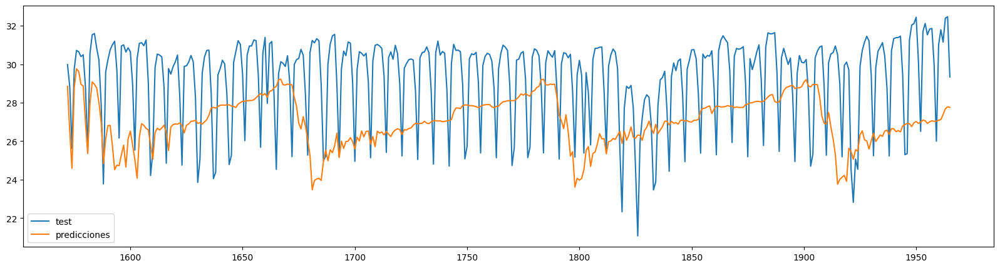

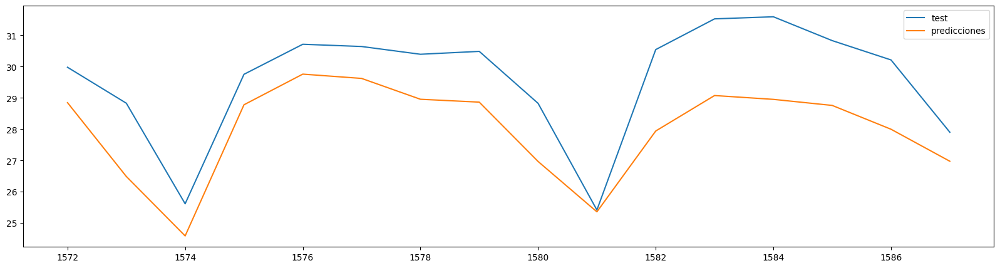

In [73]:
# Gráficos
regresion_graphs(train_6, datos_train_6, datos_test_6, predicciones_6)

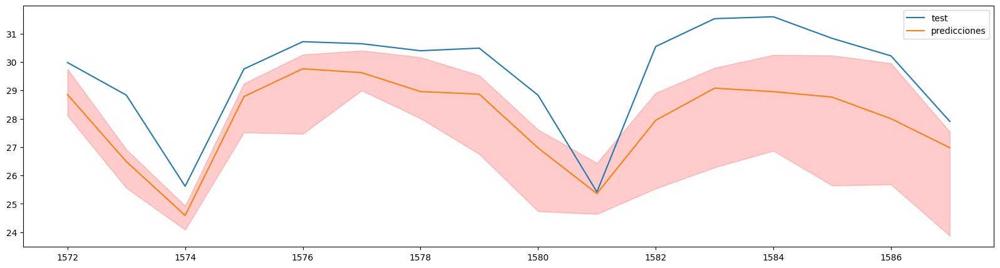

In [74]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_6, datos_test_6, predicciones_6)

### Error

In [75]:
# Cálculo de error para toda la predicción
error_mse_6 = mean_squared_error(y_true=datos_test_6['consumo'], y_pred=predicciones_6['pred'], squared=False)
error_rmse_6 = mean_squared_error(y_true=datos_test_6['consumo'], y_pred=predicciones_6['pred'], squared=True)
error_mae_6 = mean_absolute_error(y_true=datos_test_6['consumo'], y_pred=predicciones_6['pred'])
error_medae_6 = median_absolute_error(y_true=datos_test_6['consumo'], y_pred=predicciones_6['pred'])
error_mape_6 = mean_absolute_percentage_error(y_true=datos_test_6['consumo'], y_pred  = predicciones_6['pred'])

print(f"El error MSE   de test es: {error_mse_6}")
print(f"El error RMSE  de test es: {error_rmse_6}")
print(f"El error MAE   de test es: {error_mae_6}")
print(f"El error MedAE de test es: {error_medae_6}")
print(f"El error MAPE    de test es: {error_mape_6}")

El error MSE   de test es: 3.2652686638422366
El error RMSE  de test es: 10.661979447070065
El error MAE   de test es: 2.902615395850254
El error MedAE de test es: 2.8243451649999916
El error MAPE    de test es: 0.09807517478866092


In [76]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_6 = mean_squared_error(y_true=datos_test_6['consumo'].loc[:(train_6 + 15)], y_pred=predicciones_6['pred'].loc[:(train_6 + 15)], squared=False)
error_rmse_6 = mean_squared_error(y_true=datos_test_6['consumo'].loc[:(train_6 + 15)], y_pred=predicciones_6['pred'].loc[:(train_6 + 15)], squared=True)
error_mae_6 = mean_absolute_error(y_true=datos_test_6['consumo'].loc[:(train_6 + 15)], y_pred=predicciones_6['pred'].loc[:(train_6 + 15)])
error_medae_6 = median_absolute_error(y_true=datos_test_6['consumo'].loc[:(train_6 + 15)], y_pred=predicciones_6['pred'].loc[:(train_6 + 15)])
error_mape_6 = mean_absolute_percentage_error(y_true=datos_test_6['consumo'].loc[:(train_6 + 15)], y_pred=predicciones_6['pred'].loc[:(train_6 + 15)])

print(f"El error MSE   de test es: {error_mse_6}")
print(f"El error RMSE  de test es: {error_rmse_6}")
print(f"El error MAE   de test es: {error_mae_6}")
print(f"El error MedAE de test es: {error_medae_6}")
print(f"El error MAPE    de test es: {error_mape_6}")

El error MSE   de test es: 1.7445752870292075
El error RMSE  de test es: 3.0435429321130414
El error MAE   de test es: 1.5835934049374967
El error MedAE de test es: 1.5305636899999975
El error MAPE    de test es: 0.05273842022244988


## 7) Auto regresión con regresión lineal teniendo varible exogena de fin de semana

In [77]:
# Divión del dataset en train y test
train_7, datos_train_7, test_7, datos_test_7 = train_test_split(df_consumo_antioquia, 0.75)

Fechas train : 2018-01-01 00:00:00 --- 2022-01-13 00:00:00  (n=1474)
Fechas test  : 2022-01-14 00:00:00 --- 2023-05-20 00:00:00  (n=492)


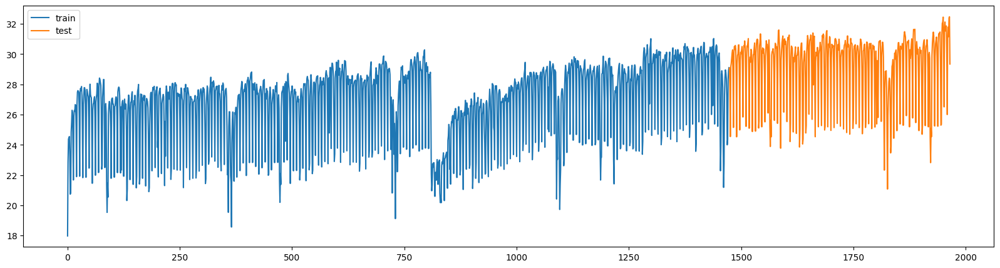

In [78]:
train_test_split_graph(train_7, datos_train_7, test_7, datos_test_7)

In [79]:
# Crear y entrenar forecaster
predicciones_7 = autoregresion(
                              datos_train=datos_train_7,
                               test=test_7,
                               datos_test=datos_test_7,
                               regressor=LinearRegression(),
                               lags=7,
                               transformer_y=None,
                               exog='fin_de_semana')

predicciones_7.head()

,pred,lower_bound,upper_bound
1474,28.660011,26.708251,30.003534
1475,25.862391,23.924162,27.325287
1476,24.367111,23.239979,26.000621
1477,26.211465,24.263377,27.554742
1478,27.903727,23.955167,29.322102


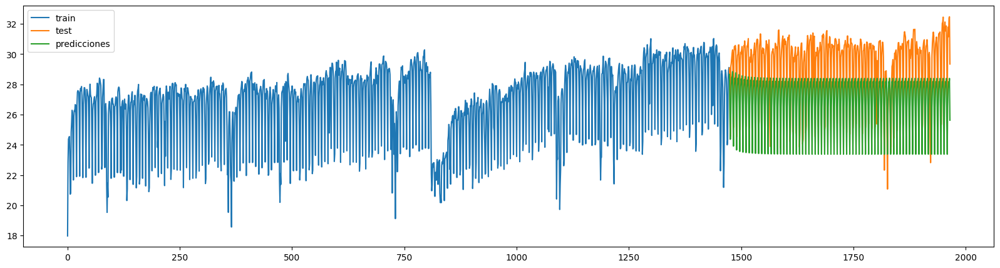

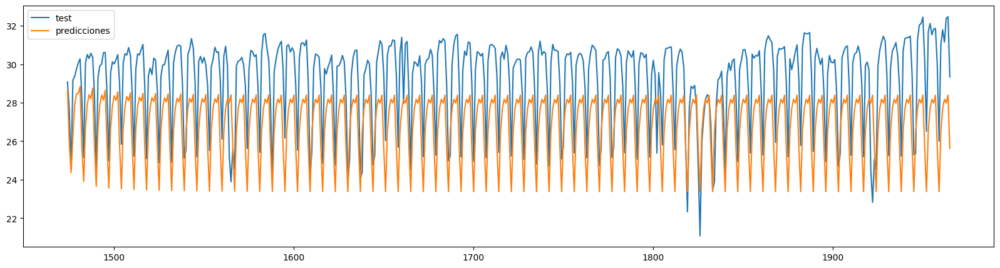

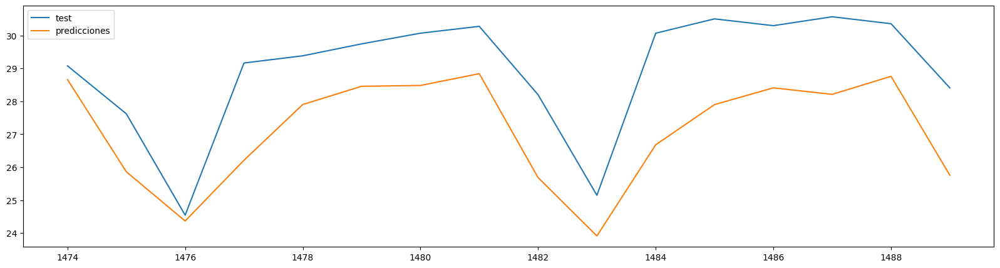

In [80]:
# Gráficos
regresion_graphs(train_7, datos_train_7, datos_test_7, predicciones_7)

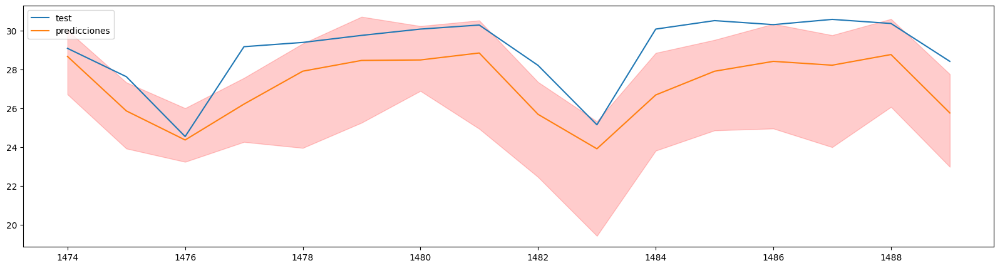

In [81]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_7, datos_test_7, predicciones_7)

### Error

In [82]:
# Cálculo de error para toda la predicción
error_mse_7 = mean_squared_error(y_true=datos_test_7['consumo'], y_pred=predicciones_7['pred'], squared=False)
error_rmse_7 = mean_squared_error(y_true=datos_test_7['consumo'], y_pred=predicciones_7['pred'], squared=True)
error_mae_7 = mean_absolute_error(y_true=datos_test_7['consumo'], y_pred=predicciones_7['pred'])
error_medae_7 = median_absolute_error(y_true=datos_test_7['consumo'], y_pred=predicciones_7['pred'])
error_mape_7 = mean_absolute_percentage_error(y_true=datos_test_7['consumo'], y_pred  = predicciones_7['pred'])

print(f"El error MSE   de test es: {error_mse_7}")
print(f"El error RMSE  de test es: {error_rmse_7}")
print(f"El error MAE   de test es: {error_mae_7}")
print(f"El error MedAE de test es: {error_medae_7}")
print(f"El error MAPE    de test es: {error_mape_7}")

El error MSE   de test es: 2.6881183537718636
El error RMSE  de test es: 7.2259802838851535
El error MAE   de test es: 2.5329676041256253
El error MedAE de test es: 2.602397698363877
El error MAPE    de test es: 0.08596540981833545


In [83]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_7 = mean_squared_error(y_true=datos_test_7['consumo'].loc[:(train_7 + 15)], y_pred=predicciones_7['pred'].loc[:(train_7 + 15)], squared=False)
error_rmse_7 = mean_squared_error(y_true=datos_test_7['consumo'].loc[:(train_7 + 15)], y_pred=predicciones_7['pred'].loc[:(train_7 + 15)], squared=True)
error_mae_7 = mean_absolute_error(y_true=datos_test_7['consumo'].loc[:(train_7 + 15)], y_pred=predicciones_7['pred'].loc[:(train_7 + 15)])
error_medae_7 = median_absolute_error(y_true=datos_test_7['consumo'].loc[:(train_7 + 15)], y_pred=predicciones_7['pred'].loc[:(train_7 + 15)])
error_mape_7 = mean_absolute_percentage_error(y_true=datos_test_7['consumo'].loc[:(train_7 + 15)], y_pred=predicciones_7['pred'].loc[:(train_7 + 15)])

print(f"El error MSE   de test es: {error_mse_7}")
print(f"El error RMSE  de test es: {error_rmse_7}")
print(f"El error MAE   de test es: {error_mae_7}")
print(f"El error MedAE de test es: {error_medae_7}")
print(f"El error MAPE    de test es: {error_mape_7}")

El error MSE   de test es: 2.0187933635079647
El error RMSE  de test es: 4.075526644543801
El error MAE   de test es: 1.8326123821477354
El error MedAE de test es: 1.6780699768758094
El error MAPE    de test es: 0.06260849359832382


## 8) Auto regresión con random forest teniendo varible exogena de fin de semana

In [84]:
# Divión del dataset en train y test
train_8, datos_train_8, test_8, datos_test_8 = train_test_split(df_consumo_antioquia, 0.80)

Fechas train : 2018-01-01 00:00:00 --- 2022-04-21 00:00:00  (n=1572)
Fechas test  : 2022-04-22 00:00:00 --- 2023-05-20 00:00:00  (n=394)


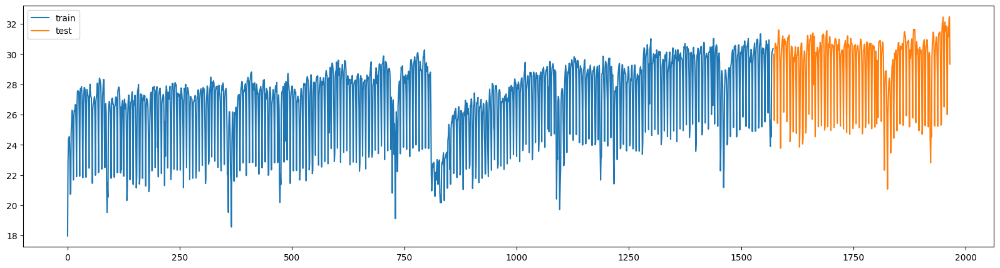

In [85]:
train_test_split_graph(train_8, datos_train_8, test_8, datos_test_8)

In [86]:
# Crear y entrenar forecaster
predicciones_8 = autoregresion(
                              datos_train=datos_train_8,
                               test=test_8,
                               datos_test=datos_test_8,
                               regressor=RandomForestRegressor(random_state=123),
                               lags=7,
                               transformer_y=None,
                               exog='fin_de_semana')

predicciones_8.head()

,pred,lower_bound,upper_bound
1572,29.613930,29.372852,29.977932
1573,26.318239,25.386807,26.734266
1574,24.138889,23.096216,24.601418
1575,27.205727,25.815472,28.208203
1576,29.659891,28.207211,30.008867


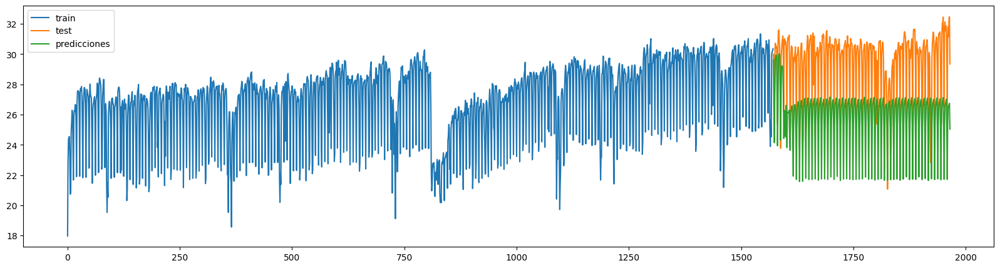

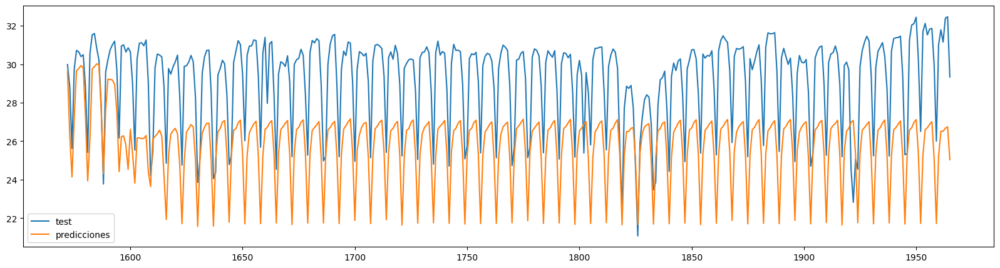

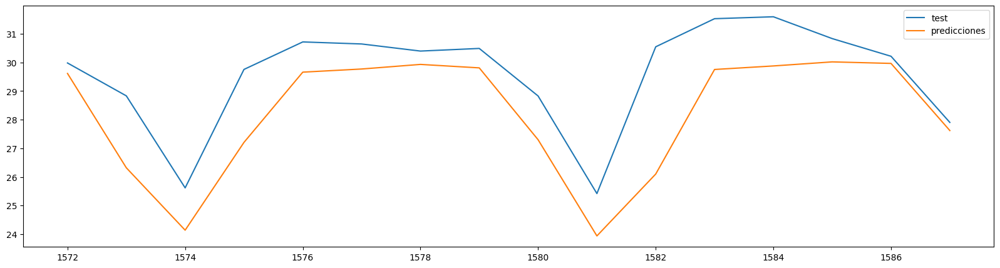

In [87]:
# Gráficos
regresion_graphs(train_8, datos_train_8, datos_test_8, predicciones_8)

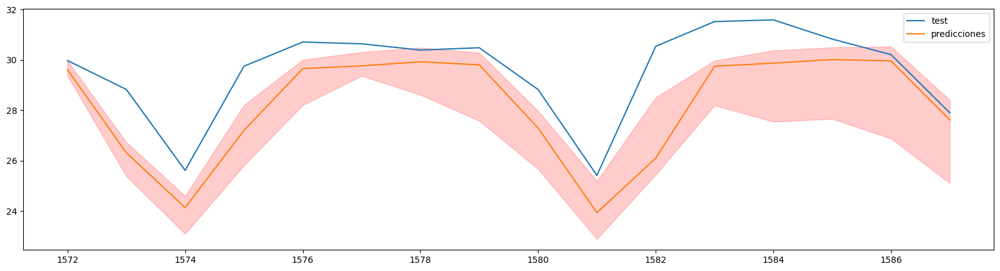

In [88]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_8, datos_test_8, predicciones_8)

### Error

In [89]:
# Cálculo de error para toda la predicción
error_mse_8 = mean_squared_error(y_true=datos_test_8['consumo'], y_pred=predicciones_8['pred'], squared=False)
error_rmse_8 = mean_squared_error(y_true=datos_test_8['consumo'], y_pred=predicciones_8['pred'], squared=True)
error_mae_8 = mean_absolute_error(y_true=datos_test_8['consumo'], y_pred=predicciones_8['pred'])
error_medae_8 = median_absolute_error(y_true=datos_test_8['consumo'], y_pred=predicciones_8['pred'])
error_mape_8 = mean_absolute_percentage_error(y_true=datos_test_8['consumo'], y_pred  = predicciones_8['pred'])

print(f"El error MSE   de test es: {error_mse_8}")
print(f"El error RMSE  de test es: {error_rmse_8}")
print(f"El error MAE   de test es: {error_mae_8}")
print(f"El error MedAE de test es: {error_medae_8}")
print(f"El error MAPE    de test es: {error_mape_8}")

El error MSE   de test es: 3.726612541224884
El error RMSE  de test es: 13.887641032414587
El error MAE   de test es: 3.527664187836039
El error MedAE de test es: 3.6908984347500002
El error MAPE    de test es: 0.11956883285598398


In [90]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_8 = mean_squared_error(y_true=datos_test_8['consumo'].loc[:(train_8 + 15)], y_pred=predicciones_8['pred'].loc[:(train_8 + 15)], squared=False)
error_rmse_8 = mean_squared_error(y_true=datos_test_8['consumo'].loc[:(train_8 + 15)], y_pred=predicciones_8['pred'].loc[:(train_8 + 15)], squared=True)
error_mae_8 = mean_absolute_error(y_true=datos_test_8['consumo'].loc[:(train_8 + 15)], y_pred=predicciones_8['pred'].loc[:(train_8 + 15)])
error_medae_8 = median_absolute_error(y_true=datos_test_8['consumo'].loc[:(train_8 + 15)], y_pred=predicciones_8['pred'].loc[:(train_8 + 15)])
error_mape_8 = mean_absolute_percentage_error(y_true=datos_test_8['consumo'].loc[:(train_8 + 15)], y_pred=predicciones_8['pred'].loc[:(train_8 + 15)])

print(f"El error MSE   de test es: {error_mse_8}")
print(f"El error RMSE  de test es: {error_rmse_8}")
print(f"El error MAE   de test es: {error_mae_8}")
print(f"El error MedAE de test es: {error_medae_8}")
print(f"El error MAPE    de test es: {error_mape_8}")

El error MSE   de test es: 1.747841860791924
El error RMSE  de test es: 3.054951170336575
El error MAE   de test es: 1.3921434362124916
El error MedAE de test es: 1.2667162370000025
El error MAPE    de test es: 0.047218353507685676


## 9) Auto regresión con regresión lineal teniendo varible exogena de temperatura

In [91]:
# Divión del dataset en train y test
train_9, datos_train_9, test_9, datos_test_9 = train_test_split(df_consumo_antioquia, 0.75)

Fechas train : 2018-01-01 00:00:00 --- 2022-01-13 00:00:00  (n=1474)
Fechas test  : 2022-01-14 00:00:00 --- 2023-05-20 00:00:00  (n=492)


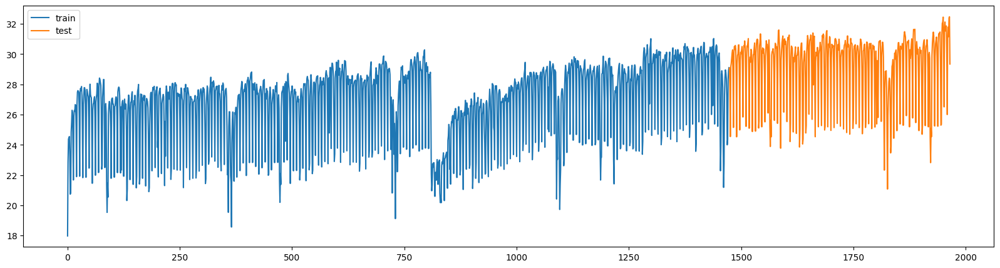

In [92]:
train_test_split_graph(train_9, datos_train_9, test_9, datos_test_9)

In [93]:
# Crear y entrenar forecaster
predicciones_9 = autoregresion(
                              datos_train=datos_train_9,
                               test=test_9,
                               datos_test=datos_test_9,
                               regressor=LinearRegression(),
                               lags=7,
                               transformer_y=None,
                               exog='temperatura')

predicciones_9.head()

,pred,lower_bound,upper_bound
1474,28.387116,26.357883,30.146297
1475,27.215878,25.053747,30.527075
1476,24.948139,23.434096,27.064484
1477,24.753450,23.053000,26.411234
1478,27.316770,24.024361,29.876259


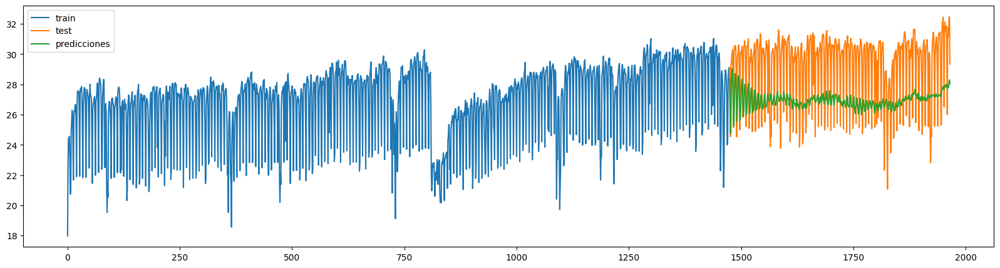

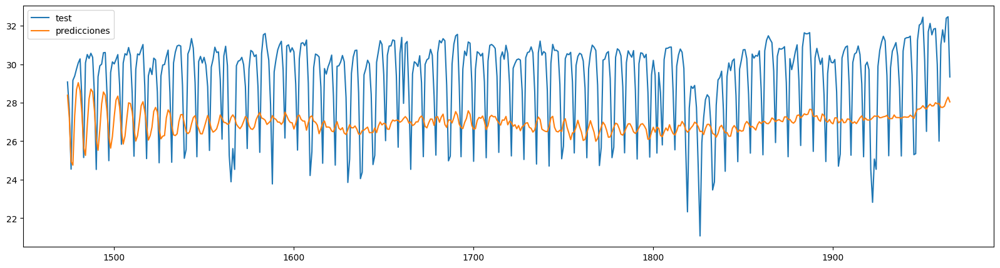

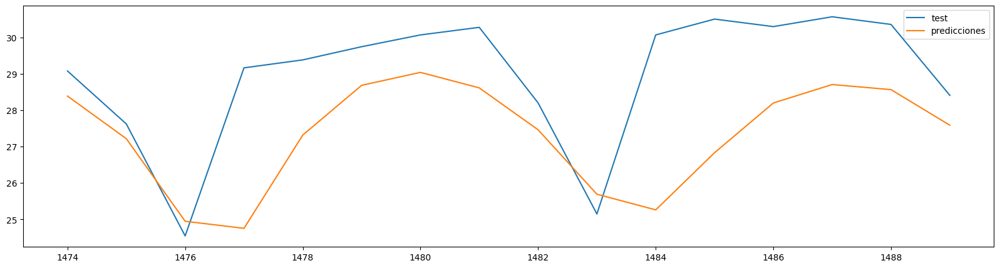

In [94]:
# Gráficos
regresion_graphs(train_9, datos_train_9, datos_test_9, predicciones_9)

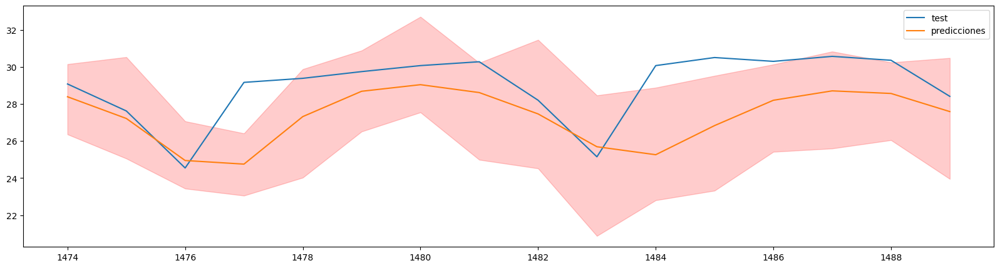

In [95]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_9, datos_test_9, predicciones_9)

### Error

In [96]:
# Cálculo de error para toda la predicción
error_mse_9 = mean_squared_error(y_true=datos_test_9['consumo'], y_pred=predicciones_9['pred'], squared=False)
error_rmse_9 = mean_squared_error(y_true=datos_test_9['consumo'], y_pred=predicciones_9['pred'], squared=True)
error_mae_9 = mean_absolute_error(y_true=datos_test_9['consumo'], y_pred=predicciones_9['pred'])
error_medae_9 = median_absolute_error(y_true=datos_test_9['consumo'], y_pred=predicciones_9['pred'])
error_mape_9 = mean_absolute_percentage_error(y_true=datos_test_9['consumo'], y_pred  = predicciones_9['pred'])

print(f"El error MSE   de test es: {error_mse_9}")
print(f"El error RMSE  de test es: {error_rmse_9}")
print(f"El error MAE   de test es: {error_mae_9}")
print(f"El error MedAE de test es: {error_medae_9}")
print(f"El error MAPE    de test es: {error_mape_9}")

El error MSE   de test es: 3.1227771400054807
El error RMSE  de test es: 9.75173706614081
El error MAE   de test es: 2.9371827675232534
El error MedAE de test es: 3.2207426849297267
El error MAPE    de test es: 0.09924557158739329


In [97]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_9 = mean_squared_error(y_true=datos_test_9['consumo'].loc[:(train_9 + 15)], y_pred=predicciones_9['pred'].loc[:(train_9 + 15)], squared=False)
error_rmse_9 = mean_squared_error(y_true=datos_test_9['consumo'].loc[:(train_9 + 15)], y_pred=predicciones_9['pred'].loc[:(train_9 + 15)], squared=True)
error_mae_9 = mean_absolute_error(y_true=datos_test_9['consumo'].loc[:(train_9 + 15)], y_pred=predicciones_9['pred'].loc[:(train_9 + 15)])
error_medae_9 = median_absolute_error(y_true=datos_test_9['consumo'].loc[:(train_9 + 15)], y_pred=predicciones_9['pred'].loc[:(train_9 + 15)])
error_mape_9 = mean_absolute_percentage_error(y_true=datos_test_9['consumo'].loc[:(train_9 + 15)], y_pred=predicciones_9['pred'].loc[:(train_9 + 15)])

print(f"El error MSE   de test es: {error_mse_9}")
print(f"El error RMSE  de test es: {error_rmse_9}")
print(f"El error MAE   de test es: {error_mae_9}")
print(f"El error MedAE de test es: {error_medae_9}")
print(f"El error MAPE    de test es: {error_mape_9}")

El error MSE   de test es: 2.2170369014563294
El error RMSE  de test es: 4.915252622419082
El error MAE   de test es: 1.7537099147581479
El error MedAE de test es: 1.3620965224562713
El error MAPE    de test es: 0.05920404931308623


## 10) Auto regresión con random forest teniendo varible exogena de temperatura

In [98]:
# Divión del dataset en train y test
train_10, datos_train_10, test_10, datos_test_10 = train_test_split(df_consumo_antioquia, 0.80)

Fechas train : 2018-01-01 00:00:00 --- 2022-04-21 00:00:00  (n=1572)
Fechas test  : 2022-04-22 00:00:00 --- 2023-05-20 00:00:00  (n=394)


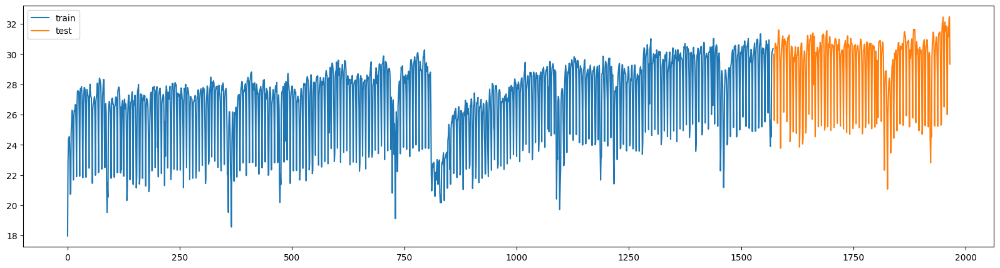

In [99]:
train_test_split_graph(train_10, datos_train_10, test_10, datos_test_10)

In [100]:
# Crear y entrenar forecaster
predicciones_10 = autoregresion(
                              datos_train=datos_train_10,
                               test=test_10,
                               datos_test=datos_test_10,
                               regressor=RandomForestRegressor(random_state=123),
                               lags=7,
                               transformer_y=None,
                               exog='temperatura')

predicciones_10.head()

,pred,lower_bound,upper_bound
1572,28.008731,27.732881,28.357696
1573,25.022422,24.410409,25.611018
1574,29.138504,27.964275,29.677342
1575,29.202050,28.858098,30.165171
1576,29.220214,28.022721,30.026197


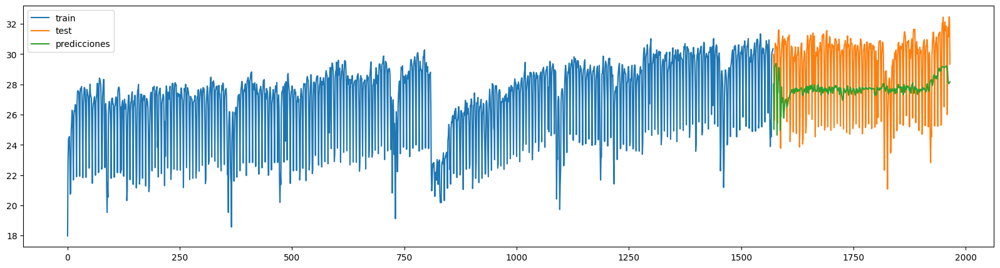

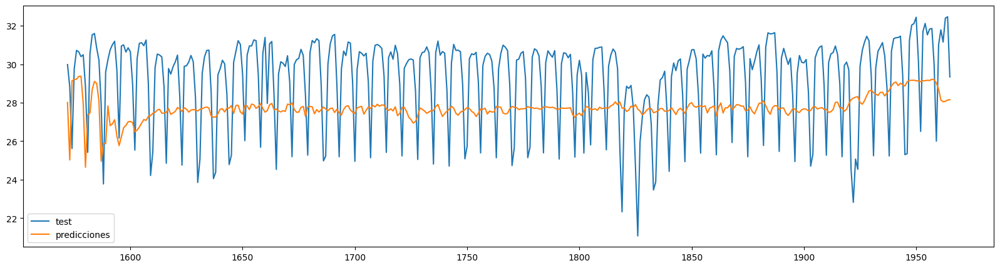

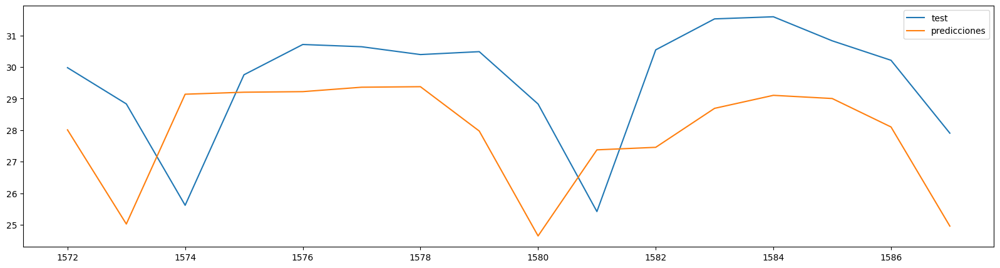

In [101]:
# Gráficos
regresion_graphs(train_10, datos_train_10, datos_test_10, predicciones_10)

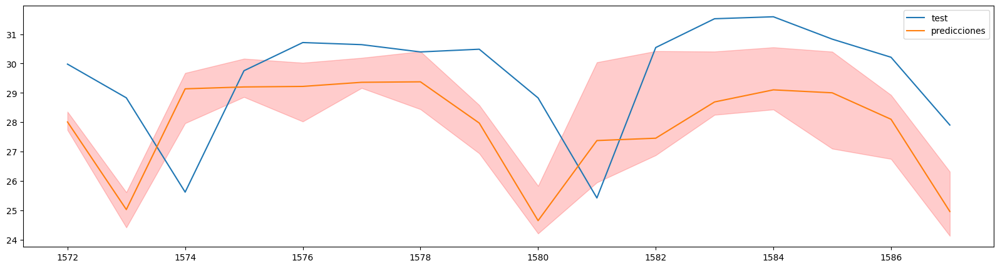

In [102]:
# Gráfico con intervalo de la predicción del 5% en ambos extremos
regresion_graphs_predict_interval(train_10, datos_test_10, predicciones_10)

### Error

In [103]:
# Cálculo de error para toda la predicción
error_mse_10 = mean_squared_error(y_true=datos_test_10['consumo'], y_pred=predicciones_10['pred'], squared=False)
error_rmse_10 = mean_squared_error(y_true=datos_test_10['consumo'], y_pred=predicciones_10['pred'], squared=True)
error_mae_10 = mean_absolute_error(y_true=datos_test_10['consumo'], y_pred=predicciones_10['pred'])
error_medae_10 = median_absolute_error(y_true=datos_test_10['consumo'], y_pred=predicciones_10['pred'])
error_mape_10 = mean_absolute_percentage_error(y_true=datos_test_10['consumo'], y_pred  = predicciones_10['pred'])

print(f"El error MSE   de test es: {error_mse_10}")
print(f"El error RMSE  de test es: {error_rmse_10}")
print(f"El error MAE   de test es: {error_mae_10}")
print(f"El error MedAE de test es: {error_medae_10}")
print(f"El error MAPE    de test es: {error_mape_10}")

El error MSE   de test es: 2.7008762280692262
El error RMSE  de test es: 7.294732399349451
El error MAE   de test es: 2.53813363583655
El error MedAE de test es: 2.620713992350005
El error MAPE    de test es: 0.08717016530039118


In [104]:
# Cálculo de error para el horizonte establecido de la predicción
error_mse_10 = mean_squared_error(y_true=datos_test_10['consumo'].loc[:(train_10 + 15)], y_pred=predicciones_10['pred'].loc[:(train_10 + 15)], squared=False)
error_rmse_10 = mean_squared_error(y_true=datos_test_10['consumo'].loc[:(train_10 + 15)], y_pred=predicciones_10['pred'].loc[:(train_10 + 15)], squared=True)
error_mae_10 = mean_absolute_error(y_true=datos_test_10['consumo'].loc[:(train_10 + 15)], y_pred=predicciones_10['pred'].loc[:(train_10 + 15)])
error_medae_10 = median_absolute_error(y_true=datos_test_10['consumo'].loc[:(train_10 + 15)], y_pred=predicciones_10['pred'].loc[:(train_10 + 15)])
error_mape_10 = mean_absolute_percentage_error(y_true=datos_test_10['consumo'].loc[:(train_10 + 15)], y_pred=predicciones_10['pred'].loc[:(train_10 + 15)])

print(f"El error MSE   de test es: {error_mse_10}")
print(f"El error RMSE  de test es: {error_rmse_10}")
print(f"El error MAE   de test es: {error_mae_10}")
print(f"El error MedAE de test es: {error_medae_10}")
print(f"El error MAPE    de test es: {error_mape_10}")

El error MSE   de test es: 2.5495316660465086
El error RMSE  de test es: 6.500111716173885
El error MAE   de test es: 2.3512922238499954
El error MedAE de test es: 2.302965761900019
El error MAPE    de test es: 0.08047848494328619


# Resumen metricas

In [118]:
pd.set_option("max_colwidth", 90)
pd.set_option("display.precision", 4)

resumen_metricas = pd.DataFrame(columns=['modelo', 'mse', 'rmse','mae','medAE', 'mape'])
resumen_metricas['modelo'] = ['Auto regresión con regresión lineal con todos los dias',
                              'Auto regresión con regresión lineal con todos los dias con datos normalizados',
                              'Auto regresión con random forest con todos los dias',
                              'Auto regresión con random forest con todos los dias con datos normalizados',
                              'Auto regresión con random forest con todos los dias con hiperparámetros',
                              'Auto regresión con random forest con todos los dias con hiperparámetros con datos normalizados',
                              'Auto regresión con regresión lineal con variable exógena de fin de semana',
                              'Auto regresión con random forest con variable exógena de fin de semana',
                              'Auto regresión con regresión lineal con variable exógena de temperatura',
                              'Auto regresión con random forest con variable exógena de temperatura', ]

resumen_metricas['mse'] = [error_mse_1, error_mse_2, error_mse_3, error_mse_4, error_mse_5, error_mse_6, error_mse_7, error_mse_8, error_mse_9, error_mse_10]
resumen_metricas['rmse'] = [error_rmse_1, error_rmse_2, error_rmse_3, error_rmse_4, error_rmse_5, error_rmse_6, error_rmse_7, error_rmse_8, error_rmse_9, error_rmse_10]
resumen_metricas['mae'] = [error_mae_1, error_mae_2, error_mae_3, error_mae_4, error_mae_5, error_mae_6, error_mae_7, error_mae_8, error_mae_9, error_mae_10]
resumen_metricas['medAE'] = [error_medae_1, error_medae_2, error_medae_3, error_medae_4, error_medae_5, error_medae_6, error_medae_7, error_medae_8, error_medae_9, error_medae_10]
resumen_metricas['mape'] = [error_mape_1, error_mape_2, error_mape_3, error_mape_4, error_mape_5, error_mape_6, error_mape_7, error_mape_8, error_mape_9, error_mape_10]

resumen_metricas.sort_values(by='mape', ascending=True).reset_index(drop = True)



,modelo,mse,rmse,mae,medAE,mape
0,Auto regresión con random forest con variable exógena de fin de semana,1.7478,3.0550,1.3921,1.2667,0.0472
1,Auto regresión con random forest con todos los dias con hiperparámetros con datos norm...,1.7446,3.0435,1.5836,1.5306,0.0527
2,Auto regresión con regresión lineal con variable exógena de temperatura,2.2170,4.9153,1.7537,1.3621,0.0592
3,Auto regresión con regresión lineal con variable exógena de fin de semana,2.0188,4.0755,1.8326,1.6781,0.0626
4,Auto regresión con random forest con todos los dias,2.3623,5.5803,1.8751,1.5756,0.0661
5,Auto regresión con regresión lineal con todos los dias,2.3733,5.6326,2.0152,1.9980,0.0674
6,Auto regresión con regresión lineal con todos los dias con datos normalizados,2.3733,5.6326,2.0152,1.9980,0.0674
7,Auto regresión con random forest con todos los dias con hiperparámetros,2.5618,6.5629,2.1408,1.6289,0.0713
8,Auto regresión con random forest con todos los dias con datos normalizados,2.5031,6.2657,2.2520,2.1652,0.0780
9,Auto regresión con random forest con variable exógena de temperatura,2.5495,6.5001,2.3513,2.3030,0.0805
